### Importing required libraries

In [350]:
import numpy as np
import pandas as pd
import os
import seaborn as sns; sns.set(style="ticks",color_codes=True)
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
%matplotlib inline

### Understanding the data

In [381]:
#read the data from DataCoSupplyChainDataset.csv into a dataframe df 
df=pd.read_csv('D:/Rajesh/Rajesh/Personal/AISanDiego/501-Introduction to AI/Project/Data/DataCoSupplyChainDataset.csv', 
               encoding='latin1')

# Checking the number of columns and rows
df.shape



(180519, 53)

In [314]:
# Show the glimps of dataset
pd.set_option('display.max_rows', 4000)
pd.set_option('display.max_columns', 55)
pd.set_option('display.width', 300)
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,20755,1/31/2018 22:56,77202,1360,13.110000,0.04,180517,327.75,0.29,1,327.75,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,19492,1/13/2018 12:27,75939,1360,16.389999,0.05,179254,327.75,-0.80,1,327.75,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,19491,1/13/2018 12:06,75938,1360,18.030001,0.06,179253,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,EE. UU.,XXXXXXXXX,Tana,19490,Tate,XXXXXXXXX,Home Office,CA,3200 Amber Bend,90027.0,2,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,19490,1/13/2018 11:45,75937,1360,22.940001,0.07,179252,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Orli,19489,Hendricks,XXXXXXXXX,Corporate,PR,8671 Iron Anchor Corners,725.0,2,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,19489,1/13/2018 11:24,75936,1360,29.500000,0.09,179251,327.75,0.45,1,327.75,298.250000,134.210007,Oceania,Queensland,PENDING_PAYMENT,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [315]:
# Identifying data types of each feature
data_types = df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

In [382]:
# Drop the 'Sales' column as it is the Dependent variable 
data = df.drop(columns=['Sales'])

#### Check Binary, Qualittaitve and Other Features 

In [353]:

# List of columns in the dataset
columns = data.columns.tolist()

# Identify binary features
binary_columns = [col for col in columns if data[col].nunique() == 2]

print("Binary Features:")
print(binary_columns)
print("\nNumber of Binary Features:", len(binary_columns))


# Identify non-binary features
non_binary_features = [col for col in data.columns if col not in binary_columns]

# Check the data types of each column
data_types = data.dtypes

# Identify qualitative features based on data type (object type in pandas usually indicates strings/characters)
qualitative_features = data_types[data_types == 'object'].index.tolist()

print("\nQualitative Features:")
print(qualitative_features)
print("\nNumber of Qualitative Features:", len(qualitative_features))


# Identify other non-binary features which are not character/quality features
non_binary_columns = [col for col in non_binary_features if col not in qualitative_features]

print("\nOther Non-Binary Features:")
print(non_binary_columns )
print("\nNumber of Other Features:", len(non_binary_columns ))

Binary Features:
['Late_delivery_risk', 'Customer Country']

Number of Binary Features: 2

Qualitative Features:
['Type', 'Delivery Status', 'Category Name', 'Customer City', 'Customer Country', 'Customer Email', 'Customer Fname', 'Customer Lname', 'Customer Password', 'Customer Segment', 'Customer State', 'Customer Street', 'Department Name', 'Market', 'Order City', 'Order Country', 'order date (DateOrders)', 'Order Region', 'Order State', 'Order Status', 'Product Image', 'Product Name', 'shipping date (DateOrders)', 'Shipping Mode']

Number of Qualitative Features: 24

Other Non-Binary Features:
['Days for shipping (real)', 'Days for shipment (scheduled)', 'Benefit per order', 'Sales per customer', 'Category Id', 'Customer Id', 'Customer Zipcode', 'Department Id', 'Latitude', 'Longitude', 'Order Customer Id', 'Order Id', 'Order Item Cardprod Id', 'Order Item Discount', 'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price', 'Order Item Profit Ratio', 'Order Item Quan

### Data Cleaning

##### Find missing values

In [354]:
#  Find missing values
missing_values = data.isnull().sum()
missing_values = missing_values[missing_values > 0] # columns with no missing values are removed

# Print results
if len(missing_values)>0:
    print("Missing Values:", missing_values,"\n")
else:
    print('No Missing Value\n')

Missing Values: Customer Lname              8
Customer Zipcode            3
Order Zipcode          155679
Product Description    180519
dtype: int64 



Features above are not significant for model and will not be taken into the model. Hence there is no action required

##### Check duplicate rows

In [355]:
# Check duplicate rows
duplicate_rows = df[df.duplicated()]  #df is used to check duplicate rows to consider the sales during duplicate checking

# Print duplicate rows details
if len(duplicate_rows>0):
    print("Number of Duplicate Rows:",len(duplicate_rows))
    print('\n')

else:
    print("No Duplicate data\n")

print("\n")    

No Duplicate data





##### Checking for exact duplicate columns and highly corelated columns

In [356]:
# Function to find exact duplicate columns
def find_exact_duplicates(df):
    """Find columns with exactly the same data."""
    duplicates = {}
    columns = data.columns
    for i in range(len(columns)):
        for j in range(i + 1, len(columns)):
            if data[columns[i]].equals(data[columns[j]]):
                if columns[i] in duplicates:
                    duplicates[columns[i]].append(columns[j])
                else:
                    duplicates[columns[i]] = [columns[j]]
    return duplicates

# Function to find highly correlated columns
def find_highly_correlated(data, threshold=0.95):
    """Find columns that are highly correlated along with their correlation values, only for numeric data."""
    # Select only numeric columns
    numeric_data = data.select_dtypes(include=[np.number])
    # Calculate correlation matrix
    corr_matrix = numeric_data.corr().abs()
    # Select upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    # List to hold pairs of highly correlated columns
    correlated_pairs = []
    for i in range(len(upper.columns)):
        for j in range(i + 1, len(upper.columns)):
            if upper.iloc[i, j] > threshold:
                col1 = upper.columns[i]
                col2 = upper.columns[j]
                correlation_value = upper.iloc[i, j]
                correlated_pairs.append((col1, col2, correlation_value))
    return correlated_pairs

# Find exact duplicates
exact_duplicates = find_exact_duplicates(df)
print("Exact duplicate columns:")
for key, values in exact_duplicates.items():
    print(f"{key}: {values}")

# Find highly correlated columns
highly_correlated_columns = find_highly_correlated(df)
print("\nHighly correlated columns (threshold > 0.95) with correlation values:")
for col1, col2, corr_value in highly_correlated_columns:
    print(f"{col1} and {col2} with correlation {corr_value:.2f}")

# Combine both results for a final list of columns to consider dropping
columns_to_consider_dropping = set([col2 for col1, col2, _ in highly_correlated_columns])
for key, values in exact_duplicates.items():
    columns_to_consider_dropping.update(values)

print("\nColumns to consider dropping:")
print(columns_to_consider_dropping)


Exact duplicate columns:
Benefit per order: ['Order Profit Per Order']
Sales per customer: ['Order Item Total']
Category Id: ['Product Category Id']
Customer Email: ['Customer Password']
Customer Id: ['Order Customer Id']
Order Item Cardprod Id: ['Product Card Id']
Order Item Product Price: ['Product Price']

Highly correlated columns (threshold > 0.95) with correlation values:
Benefit per order and Order Profit Per Order with correlation 1.00
Sales per customer and Sales with correlation 0.99
Sales per customer and Order Item Total with correlation 1.00
Category Id and Order Item Cardprod Id with correlation 0.99
Category Id and Product Card Id with correlation 0.99
Category Id and Product Category Id with correlation 1.00
Customer Id and Order Customer Id with correlation 1.00
Order Id and Order Item Id with correlation 1.00
Order Item Cardprod Id and Product Card Id with correlation 1.00
Order Item Cardprod Id and Product Category Id with correlation 0.99
Order Item Product Price an

Check for constant features

In [357]:
# Check for constant features (features with zero variance)
constant_features = [col for col in data.columns if data[col].nunique() == 1]
print("Constant features:", constant_features)

Constant features: ['Customer Email', 'Customer Password', 'Product Status']


#### Removal of duplicate, highly corelated, constant and unrelated features from the dataset based on application of domain knowledge

In [383]:
Feature_List = ['Type', 'Benefit per order', 'Sales per customer', 
          'Delivery Status', 'Late_delivery_risk', 'Category Name', 'Customer City', 'Customer Country', 
           'Customer Segment', 
          'Customer State', 'Department Name', 
          'Market', 'Order City', 'Order Country', 'order date (DateOrders)',  
          'Order Item Discount', 'Order Item Discount Rate', 
           'Order Item Profit Ratio', 'Order Item Quantity',   
           'Order Region', 'Order State', 'Order Status', 
          'Product Category Id', 'Product Name', 'Product Price', 
       'shipping date (DateOrders)', 'Shipping Mode']
df_relevant_features=df[Feature_List]

#Inpecting the data with relevant features
df_relevant_features.head()

,Type,Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Department Name,Market,Order City,Order Country,order date (DateOrders),Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Order Region,Order State,Order Status,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Shipping Mode
0,DEBIT,91.250000,314.640015,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,Fitness,Pacific Asia,Bekasi,Indonesia,1/31/2018 22:56,13.110000,0.04,0.29,1,Southeast Asia,Java Occidental,COMPLETE,73,Smart watch,327.75,2/3/2018 22:56,Standard Class
1,TRANSFER,-249.089996,311.359985,Late delivery,1,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,Fitness,Pacific Asia,Bikaner,India,1/13/2018 12:27,16.389999,0.05,-0.80,1,South Asia,Rajastán,PENDING,73,Smart watch,327.75,1/18/2018 12:27,Standard Class
2,CASH,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,Fitness,Pacific Asia,Bikaner,India,1/13/2018 12:06,18.030001,0.06,-0.80,1,South Asia,Rajastán,CLOSED,73,Smart watch,327.75,1/17/2018 12:06,Standard Class
3,DEBIT,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,Fitness,Pacific Asia,Townsville,Australia,1/13/2018 11:45,22.940001,0.07,0.08,1,Oceania,Queensland,COMPLETE,73,Smart watch,327.75,1/16/2018 11:45,Standard Class
4,PAYMENT,134.210007,298.250000,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Corporate,PR,Fitness,Pacific Asia,Townsville,Australia,1/13/2018 11:24,29.500000,0.09,0.45,1,Oceania,Queensland,PENDING_PAYMENT,73,Smart watch,327.75,1/15/2018 11:24,Standard Class


Check for Nan Values in Features

In [384]:

# Check for NaN values 
nan_counts = df_relevant_features.isnull().sum()
print("NaN counts per column:\n", nan_counts[nan_counts > 0])

NaN counts per column:
 Series([], dtype: int64)


Check for Features with Negative Values

In [385]:
# Select only numeric columns
numeric_df = df_relevant_features.select_dtypes(include=['number'])

# Identify columns with negative values and count the number of negative values in each column
negative_counts = numeric_df.apply(lambda x: (x < 0).sum())

# Filter to show only columns with negative values
negative_columns = negative_counts[negative_counts > 0]

print(negative_columns)


Benefit per order          33784
Order Item Profit Ratio    33784
dtype: int64


These values are significant and can not be deleted just like that

#### Again get the binary, qualitative and non binary features based on the relevant features

In [386]:

# List of columns in the dataset
columns = df_relevant_features.columns.tolist()

# Identify binary features
binary_columns = [col for col in columns if df_relevant_features[col].nunique() == 2]

print("Binary Features:")
print(binary_columns)
print("\nNumber of Binary Features:", len(binary_columns))


# Identify non-binary features
non_binary_features = [col for col in df_relevant_features.columns if col not in binary_columns]

# Check the data types of each column
data_types = df_relevant_features.dtypes

# Identify qualitative features based on data type (object type in pandas usually indicates strings/characters)
qualitative_features = data_types[data_types == 'object'].index.tolist()

print("\nQualitative Features:")
print(qualitative_features)
print("\nNumber of Qualitative Features:", len(qualitative_features))


# Identify other non-binary features which are not character/quality features
non_binary_columns = [col for col in non_binary_features if col not in qualitative_features]

print("\nOther Non-Binary Features:")
print(non_binary_columns )
print("\nNumber of Other Features:", len(non_binary_columns ))

Binary Features:
['Late_delivery_risk', 'Customer Country']

Number of Binary Features: 2

Qualitative Features:
['Type', 'Delivery Status', 'Category Name', 'Customer City', 'Customer Country', 'Customer Segment', 'Customer State', 'Department Name', 'Market', 'Order City', 'Order Country', 'order date (DateOrders)', 'Order Region', 'Order State', 'Order Status', 'Product Name', 'shipping date (DateOrders)', 'Shipping Mode']

Number of Qualitative Features: 18

Other Non-Binary Features:
['Benefit per order', 'Sales per customer', 'Order Item Discount', 'Order Item Discount Rate', 'Order Item Profit Ratio', 'Order Item Quantity', 'Product Category Id', 'Product Price']

Number of Other Features: 8


##### Check Outliers in Non-binary Features through Quantile

In [387]:
# Task 3: Check outliers in non-binary columns through Quantile 
outliers_quantile = {}

for col in non_binary_columns:
    # Calculate IQR
    Q1 = df_relevant_features[col].quantile(0.25)
    Q3 = df_relevant_features[col].quantile(0.75)
    IQR = Q3 - Q1
    
    # Find outliers
    outlier_indices_quantile = df_relevant_features[(df_relevant_features[col] < (Q1 - 1.5 * IQR)) | (df_relevant_features[col] > (Q3 + 1.5 * IQR))].index
    if len(outlier_indices_quantile) > 0:
        outliers_quantile[col] = outlier_indices_quantile

# Display the results
features_with_outliers = {col: len(indices) for col, indices in outliers_quantile.items()}
print("\nFeatures with Outliers (as per quantile):", features_with_outliers)



Features with Outliers (as per quantile): {'Benefit per order': 18942, 'Sales per customer': 1943, 'Order Item Discount': 7537, 'Order Item Profit Ratio': 17300, 'Product Price': 2048}


#### Checking outliers through z-score

In [388]:
# Calculate Z-scores and identify outliers
outliers_z_score = {}

for col in non_binary_columns:
    z_scores = (df_relevant_features[col] - df_relevant_features[col].mean()) / df_relevant_features[col].std()
    outlier_indices = df_relevant_features[np.abs(z_scores) > 3].index
    if len(outlier_indices) > 0:
        outliers_z_score[col] = outlier_indices

# Display the results
outliers_z_score_summary = {col: len(indices) for col, indices in outliers_z_score.items()}
print("\nFeatures with Outliers (as per z_score):",outliers_z_score_summary,'\n')



Features with Outliers (as per z_score): {'Benefit per order': 3608, 'Sales per customer': 477, 'Order Item Discount': 2106, 'Order Item Profit Ratio': 6013, 'Product Price': 488} 



##### Combined Features Suspected of Having Outliers

In [389]:
# Combine keys from both dictionaries and remove duplicates
outliers_all = list(set(outliers_quantile.keys()).union(set(outliers_z_score.keys())))

# Print the final list of unique keys
print("All possible features with outliers:", outliers_all,"\n")



All possible features with outliers: ['Order Item Profit Ratio', 'Product Price', 'Benefit per order', 'Sales per customer', 'Order Item Discount'] 



#### Plotting Features with Outliers

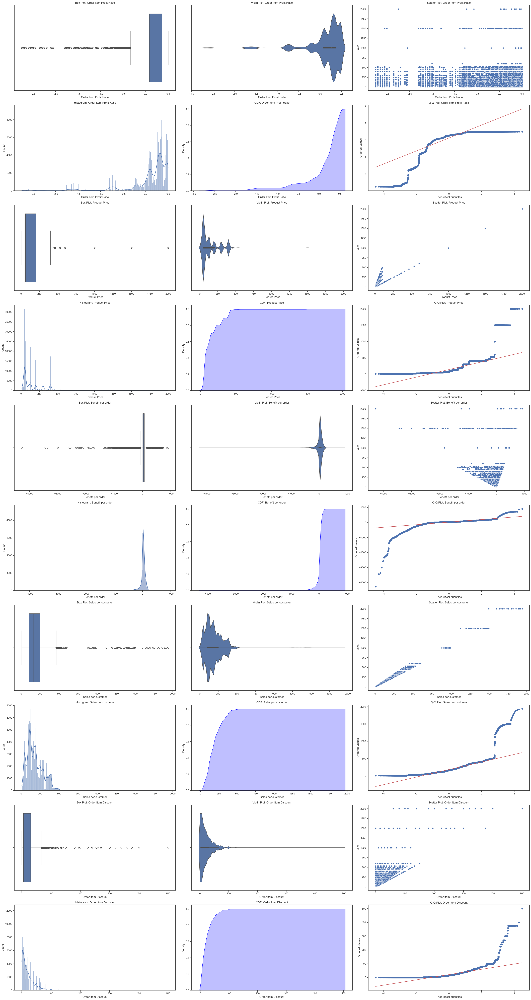

In [365]:
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats


# Setting up the figure with 2 rows for each feature (one for the first three plots, one for the last three)
num_rows = len(outliers_all) * 2

fig, axes = plt.subplots(num_rows, 3, figsize=(32, num_rows * 6))
axes = axes.reshape(num_rows, 3)  # Ensure the axes array is 2D

for i, feature in enumerate(outliers_all):
    # Calculate the row index for plots (i*2 because each feature uses two rows)
    row = i * 2
    
    # Box Plot
    sns.boxplot(data=df_relevant_features, x=feature, ax=axes[row, 0])
    axes[row, 0].set_title(f'Box Plot: {feature}')
    
    # Violin Plot
    sns.violinplot(data=df_relevant_features, x=feature, ax=axes[row, 1])
    axes[row, 1].set_title(f'Violin Plot: {feature}')
    
    # Scatter Plot
    sns.scatterplot(data=df, x=feature, y='Sales', ax=axes[row, 2])
    axes[row, 2].set_title(f'Scatter Plot: {feature}')
    
    # Histogram
    sns.histplot(df_relevant_features[feature], kde=True, ax=axes[row + 1, 0])
    axes[row + 1, 0].set_title(f'Histogram: {feature}')

    # CDF
    sns.kdeplot(df_relevant_features[feature], cumulative=True, fill=True, color='blue', ax=axes[row + 1, 1])
    axes[row + 1, 1].set_title(f'CDF: {feature}')

    # Q-Q Plot
    stats.probplot(df_relevant_features[feature], dist="norm", plot=axes[row + 1, 2])
    axes[row + 1, 2].set_title(f'Q-Q Plot: {feature}')

# Adjust layout to prevent plot overlap
plt.tight_layout()
plt.show()


#### Analysis of outliers through visual inspection

1) Benefits per order: 

    "Benefit per Order" contains significant outliers, with both extremely high and low values, which could represent theoritically exceptional cases or data errors. The Q-Q plot deviates substantially from the line at both ends, confirming non-normality.  These outliers represent a valid but rare business scenario.

    These outliers will have a strong impact on mean calculations and any models that assume normality. They could also influence regression outcomes if not addressed.

    Hence the performance of the chosen model will become very important.

2) Product Price

    The "Product Price" data exhibits a non-uniform distribution with multiple modes, suggesting segmentation within the product offerings. The presence of outliers, particularly on the higher end, indicates that while most products are moderately priced, a small selection of products are significantly more expensive. These could represent specialty or luxury items.

    Any predictive modeling should consider the skewed and multimodal nature of the data. Non-linear models or segmented approaches might be more appropriate than assuming a normal distribution of prices.

3) Sales per Customer

    "Sales per Customer" data is highly skewed with a significant number of outliers on the high end, which could have implications for how sales strategies are developed and targeted. These outliers might represent key opportunities or risks for the business, depending on the nature of these high-value sales. Understanding the characteristics of customers who generate these higher sales could provide insights into customer behavior, preferences, or product appeal.

    For predictive modeling or statistical analysis, consider techniques to manage outliers, such as transformations (e.g., logarithmic) to reduce skewness or using models that are robust to outliers.

4) Order Item Discount

    "Order Item Discount" shows a predominant occurrence of smaller discounts with occasional large outliers. These outliers may need further investigation to determine if they are due to special promotions, specific customer dealings, or data errors.

    For analyses involving this variable, consider transformations or non-parametric methods that can handle the skew and outliers effectively. Also, robust statistical measures like the median or modal discount might provide better insights than the mean in this skewed distribution.

5) Order Item Profit Ratio

    The "Order Item Profit Ratio" exhibits complex dynamics with a broad spread of values, indicating that different items or orders contribute unevenly to profitability. The presence of outliers and the broad distribution suggest a diverse business model where some items are significantly more or less profitable than others.

    Given the skewness and outliers, using median or mode-based measures for central tendency and variability could be more informative than means.

    Breaking down the profit ratio by product categories, customer segments, or sales channels may reveal underlying patterns that are obscured when looking at aggregated data.

#### Further Analysis of Outliers using Corelation

In [390]:
#For corelation add target variable 'Sales' to outliers_all 

outliers_all.append('Sales')

# Subsetting df to include only the columns with outliers plus 'Sales'
outliers_df = df[outliers_all]

# Calculate the correlation matrix
correlation_matrix_outliers = outliers_df.corr()

# Print the correlation matrix
print(correlation_matrix_outliers)

                         Order Item Profit Ratio  Product Price  Benefit per order  Sales per customer  Order Item Discount     Sales
Order Item Profit Ratio                 1.000000      -0.002043           0.823689           -0.001439            -0.002788 -0.001766
Product Price                          -0.002043       1.000000           0.103459            0.781781             0.488101  0.789948
Benefit per order                       0.823689       0.103459           1.000000            0.133484             0.064756  0.131816
Sales per customer                     -0.001439       0.781781           0.133484            1.000000             0.498734  0.989744
Order Item Discount                    -0.002788       0.488101           0.064756            0.498734             1.000000  0.617438
Sales                                  -0.001766       0.789948           0.131816            0.989744             0.617438  1.000000


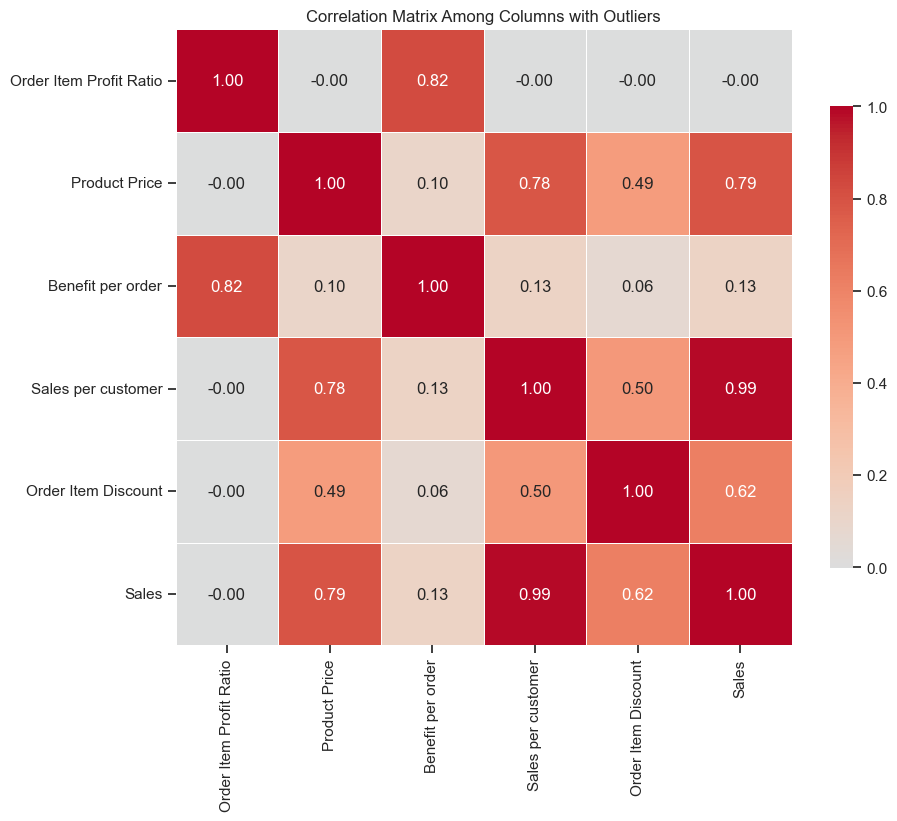

In [400]:
# Plotting the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_outliers, annot=True, fmt=".2f", cmap='coolwarm', center=0, square=True, linewidths=.5, cbar_kws={"shrink": .75})
plt.title('Correlation Matrix Among Columns with Outliers')
plt.show()


#### Interpretation of Key Correlations in non binary columns
 - High Correlations with Sales:

    Sales per customer shows a very high correlation of 0.99 with Sales. So sales per customer is a critical driver of overall sales, suggesting that strategies aimed at increasing sales per transaction could effectively boost total sales.

    Product Price is also highly corelated with Sales (0.79) indicating  that higher-priced items significantly contribute to total sales, suggesting that managing pricing strategies could have a substantial impact on sales performance.

    Order Item Discount is also highly correlated with Sales (0.62), suggesting that discounts may drive higher sales volumes, indicating that promotional activities could be an effective sales strategy.

- Low corelation with sales:

    Benefit per order: 0.13181 - Suggests some level of association but indicates that benefits per order are not a strong predictor of sales volume

    Order Item Profit Ratio: -0.001766 - Negligible correlation showing that the profit margin per item does not significantly impact the total sales volume

- Relationships between Features:

    a) Benefit per order and Other Variables:

    Order Item Profit Ratio : 0.823689. Indicates strong positive correlation. This relationship implies a linear dependency which can be crucial in predictive modeling.

    Sales per customer: 0.133484. A modest correlation suggests a weak positive relationship, indicating that benefits per order slightly increase with sales per customer but might not be strong enough to warrant direct modeling without considering other variables.

    Product Price: 0.103459. Weak positive correlation, which means higher product prices might slightly increase the benefits per order. This can be included in model considerations but with cautious interpretation due to its weak strength.

    b) Product Price:

    Sales per customer: 0.781781. A strong correlation implies that as product prices increase, the sales per customer also tend to increase, which can be vital for revenue prediction models.

    Order Item Discount: 0.488101. A moderate correlation indicates that higher-priced products tend to have higher discounts. This could be useful for promotional strategy models and customer segmentation
    
    c) Sales per customer and Order Item Discount: 0.498734. Indicates a moderate relationship where higher sales per customer are associated with higher discounts. This can be an essential factor in sales promotion analysis and customer segmentation.

#### Data Preparation Insights

- Linear Models (LinearRegression, Lasso, Ridge, SGD Regressor)

1. Benefit per Order

    Transformation: Apply logarithmic transformations to mitigate the effect of extreme outliers.

    Dimensionality Reduction: Consider PCA if combining with Order Item Profit Ratio to avoid multicollinearity.

2. Product Price

    Normalization/Standardization: Standardize to manage scale differences.

3. Sales per Customer

    Transformation: Use logarithmic transformations to reduce skewness and stabilize variance.

4. Order Item Discount

    Robust Scaling: Utilize RobustScaler to reduce the impact of extreme values.

5. Order Item Profit Ratio

    Transformation: Apply logarithmic transformations, especially if used in conjunction with Benefit per Order.

- Tree-Based Models (Random Forest, XG Boost, Decision Tree Regressor)

1. Benefit per Order

    Direct Use: Can handle raw values but consider feature engineering to capture interactions with other variables if necessary.

2. Product Price

    Direct Use: No need for scaling; consider binning if there are natural groupings that impact target predictions.

3. Sales per Customer

    Direct Use: Handle raw values; tree-based models can deal with outliers effectively.

4. Order Item Discount

    Direct Use: Similar to sales per customer, no need for transformations.

5. Order Item Profit Ratio

    Direct Use: Handle raw values but watch for the influence of extreme outliers.

- Time Series Models (ARIMA, Seasonal ARIMA, Prophet, LSTM)

1. Benefit per Order

    Handling: Typically not used unless it shows a clear time-dependent trend.

2. Product Price

    Standardization: If used as an exogenous variable, ensure it is standardized and stationary.

3. Sales per Customer

    Differencing/Transformation: Ensure stationarity through differencing and use transformations like logarithmic to stabilize variance.

4. Order Item Discount

    Handling: Might not be directly used unless there is a clear temporal pattern affecting sales.

5. Order Item Profit Ratio

    Handling: Not typically used unless analyzing profitability trends over time.

- Summary and General Recommendations

    Transformation for Skewness and Outliers: Logarithmic transformations are recommended across model types for highly skewed distributions (e.g., Sales per Customer, Benefit per Order).

    Standardization and Normalization: Primarily important for linear models, especially when features vary widely in scales (e.g., Product Price).

    Direct Use in Non-Linear Models: Tree-based models handle outliers and non-linear relationships well, so raw values can often be used directly.

#### Preparing Data files for different types of models

In [401]:

# Initialize the DataFrames to an empty DataFrame 
df_linear_models_features = pd.DataFrame()
df_treebased_models_features = pd.DataFrame()
df_timeseries_models_features = pd.DataFrame()

# Now assign the actual DataFrames
df_linear_models_features = df_relevant_features.copy()
df_treebased_models_features = df_relevant_features.copy()
df_timeseries_models_features = df_relevant_features.copy()

### Preparing data for Linear Models

Checking for multi-colinearity

In [393]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming df_relevant_features is your DataFrame containing relevant numerical features

# Check for constant features (features with zero variance)
constant_features = [col for col in df_linear_models_features.columns if df_linear_models_features[col].nunique() == 1]
print("Constant features:", constant_features)

# Check for NaN values and handle them if present
nan_counts = df_linear_models_features.isnull().sum()
print("NaN counts per column:\n", nan_counts[nan_counts > 0])

Constant features: []
NaN counts per column:
 Series([], dtype: int64)


Check for VIF Values for Multi-colinearity

In [402]:
# Select only numerical features for VIF calculation
numerical_features = df_linear_models_features.select_dtypes(include=[np.number])

# Standardize the numerical features for consistency in VIF calculation
scaler = StandardScaler()
scaled_features = scaler.fit_transform(numerical_features)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = numerical_features.columns
vif_data["VIF"] = [variance_inflation_factor(scaled_features, i) for i in range(scaled_features.shape[1])]

# Display the VIF values
print(vif_data)


                    Feature        VIF
0         Benefit per order   3.296135
1        Sales per customer  14.339525
2        Late_delivery_risk   1.000045
3       Order Item Discount   4.817976
4  Order Item Discount Rate   3.371877
5   Order Item Profit Ratio   3.237374
6       Order Item Quantity   7.042234
7       Product Category Id   1.466779
8             Product Price  21.094682


#### Doing Required transformations for data preparation of linear models

- Benefit per order and Order Item Profit Ratio have negative values. Hence using yeo-johnson method of PowerTransformer

In [403]:
from sklearn.preprocessing import PowerTransformer

# Apply Yeo-Johnson transformation

# Create a new instance of PowerTransformer for each feature
power_transformer_benefit = PowerTransformer(method='yeo-johnson')
power_transformer_profit_ratio = PowerTransformer(method='yeo-johnson')

# Use .loc[] to avoid SettingWithCopyWarning
df_linear_models_features.loc[:, 'Benefit per order'] = power_transformer_benefit.fit_transform(df_linear_models_features[['Benefit per order']])
df_linear_models_features.loc[:, 'Order Item Profit Ratio'] = power_transformer_profit_ratio.fit_transform(df_linear_models_features[['Order Item Profit Ratio']])

# Display transformed data
print(df_linear_models_features[['Benefit per order', 'Order Item Profit Ratio']].head())


   Benefit per order  Order Item Profit Ratio
0           0.892824                 0.231270
1          -1.875511                -1.822335
2          -1.869528                -1.822335
3          -0.257417                -0.640242
4           1.690495                 1.216647


- Transforming Sales per customer, Product Price and Order Item Discount

In [404]:
# Trying this to take care of incompatible dtype.
from sklearn.preprocessing import StandardScaler, RobustScaler

# Ensure df_linear_models_features is a copy to avoid SettingWithCopyWarning
df_linear_models_features = df_linear_models_features.copy()

# Identify numeric columns
numeric_columns = df_linear_models_features.select_dtypes(include=[np.number]).columns

# Convert all numeric columns to float before transformation
df_linear_models_features[numeric_columns] = df_linear_models_features[numeric_columns].astype(float)

# Logarithmic Transformation to reduce skewness
df_linear_models_features['Sales per customer'] = np.log1p(df_linear_models_features['Sales per customer'])
df_linear_models_features['Product Price'] = np.log1p(df_linear_models_features['Product Price'])

# Apply robust scaling to handle outliers
robust_scaler = RobustScaler()
df_linear_models_features['Order Item Discount'] = robust_scaler.fit_transform(df_linear_models_features[['Order Item Discount']])

# Standardize numeric features to bring them to a similar scale
standard_scaler = StandardScaler()
df_linear_models_features[numeric_columns] = standard_scaler.fit_transform(df_linear_models_features[numeric_columns])

# Display the prepared DataFrame
print(df_linear_models_features.head())


       Type  Benefit per order  Sales per customer   Delivery Status  Late_delivery_risk   Category Name Customer City Customer Country Customer Segment Customer State Department Name        Market  Order City Order Country order date (DateOrders)  Order Item Discount  Order Item Discount Rate  \
0     DEBIT           0.892824            1.088671  Advance shipping           -1.101733  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia      Bekasi     Indonesia         1/31/2018 22:56            -0.346534                 -0.875782   
1  TRANSFER          -1.875511            1.073391     Late delivery            0.907661  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia     Bikaner         India         1/13/2018 12:27            -0.196082                 -0.733767   
2      CASH          -1.869528            1.065690  Shipping on time           -1.101733  Sporting Goods  

- Doing PCA for Sales per customer and Product Price

In [405]:
from sklearn.decomposition import PCA

# Ensure these features are in your DataFrame
features_for_pca = ['Sales per customer', 'Product Price']

# Initialize PCA
pca = PCA(n_components=1)  # Use 1 component if you want to reduce it to a single dimension

# Fit PCA on the selected features
pca_result = pca.fit_transform(df_linear_models_features[features_for_pca])

# Add the PCA result as a new feature in the DataFrame
df_linear_models_features['PCA_Sales_Price'] = pca_result

# Optionally, drop the original features if you are using the PCA component instead
df_linear_models_features.drop(features_for_pca, axis=1, inplace=True)

# Display the DataFrame to verify the changes
print(df_linear_models_features.head())


       Type  Benefit per order   Delivery Status  Late_delivery_risk   Category Name Customer City Customer Country Customer Segment Customer State Department Name        Market  Order City Order Country order date (DateOrders)  Order Item Discount  Order Item Discount Rate  \
0     DEBIT           0.892824  Advance shipping           -1.101733  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia      Bekasi     Indonesia         1/31/2018 22:56            -0.346534                 -0.875782   
1  TRANSFER          -1.875511     Late delivery            0.907661  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia     Bikaner         India         1/13/2018 12:27            -0.196082                 -0.733767   
2      CASH          -1.869528  Shipping on time           -1.101733  Sporting Goods      San Jose          EE. UU.         Consumer             CA         Fitness  P

### Visualizing after transformation

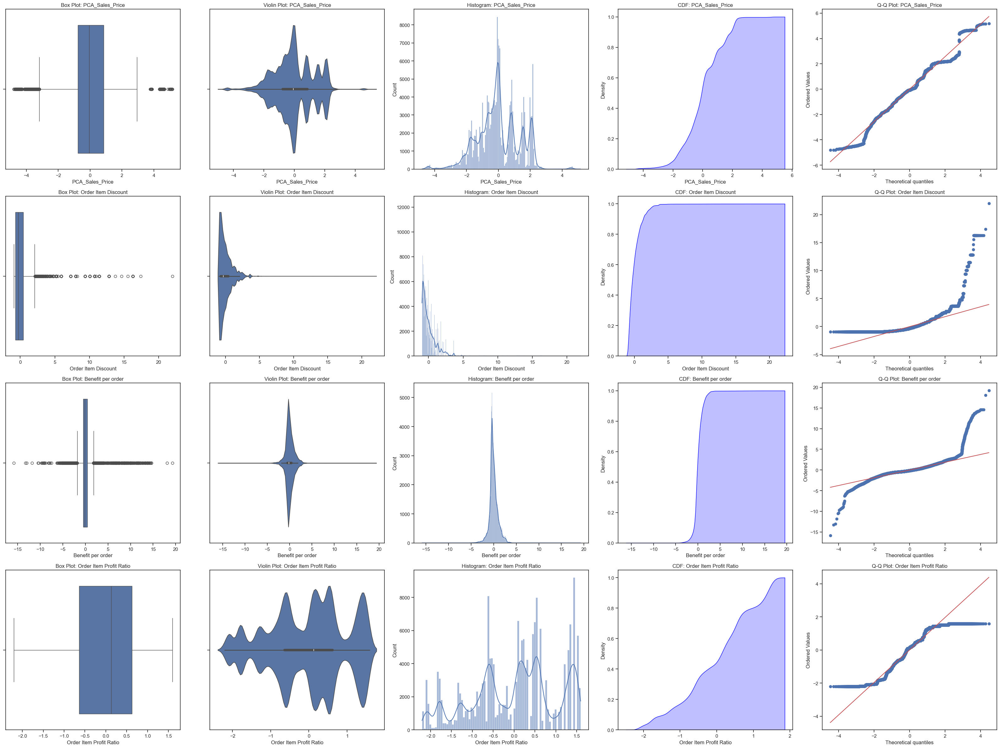

In [398]:
# List of selected features
selected_features = ['PCA_Sales_Price', 'Order Item Discount', 'Benefit per order', 'Order Item Profit Ratio']

# Setting up the figure with 2 rows for each feature (one for the first three plots, one for the last three)
num_rows = len(selected_features) 

fig, axes = plt.subplots(num_rows, 5, figsize=(32, num_rows * 6))
axes = axes.reshape(num_rows, 5)  # Ensure the axes array is 2D

for i, feature in enumerate(selected_features):
    # Calculate the row index for plots (i*2 because each feature uses two rows)
    row = i
    
    # Box Plot
    sns.boxplot(data=df_linear_models_features, x=feature, ax=axes[row, 0])
    axes[row, 0].set_title(f'Box Plot: {feature}')
    
    # Violin Plot
    sns.violinplot(data=df_linear_models_features, x=feature, ax=axes[row, 1])
    axes[row, 1].set_title(f'Violin Plot: {feature}')
    
   # Histogram
    sns.histplot(df_linear_models_features[feature], kde=True, ax=axes[row, 2])
    axes[row, 2].set_title(f'Histogram: {feature}')

    # CDF
    sns.kdeplot(df_linear_models_features[feature], cumulative=True, fill=True, color='blue', ax=axes[row, 3])
    axes[row, 3].set_title(f'CDF: {feature}')

    # Q-Q Plot
    stats.probplot(df_linear_models_features[feature], dist="norm", plot=axes[row, 4])
    axes[row, 4].set_title(f'Q-Q Plot: {feature}')

# Adjust layout to prevent plot overlap
plt.tight_layout()
plt.show()


- PCA_Sales_Price:

    While the PCA has transformed the features into a new composite feature that captures a significant amount of information, the presence of outliers and multimodality should be considered in any further analysis or modeling. 

- Order item Discount

    Box Plot: The transformation has effectively managed to reduce the impact of outliers, making the dataset more suitable for models that are sensitive to extreme values.

    Violin Plot: The data still shows asymmetry but is more balanced, which may help in certain types of analyses and modeling.

    Histogram: While the transformation has addressed some of the skewness, considerable skewness remains.

    CDF: The smoother CDF suggests an improvement in the distribution's uniformity, beneficial for modeling as it indicates less bias toward one end of the spectrum.

    Q-Q Plot: The reduced deviation in the Q-Q plot post-transformation suggests improvements towards normality, but further steps might be needed to fully normalize the data, for linear models.

    Overall, the transformations applied have made significant improvements to the data’s structure, enhancing its suitability for various analytical and predictive modeling tasks. Additional steps might include further normalization techniques or outlier handling depending on the specific requirements of subsequent analyses or models.

- Benefits per order

    The transformation process applied has significantly standardized the data. It appears to reduce skewness and manage outliers effectively, making the data more suitable for analytical models that assume normality. The data now conforms more closely to a normal distribution, which is ideal for many modeling techniques.

    It suggests that further outlier management could be applied, although the data now conforms more closely to a normal distribution, which is ideal for many modeling techniques.

- Order Item Profit Ratio

    The transformation applied to the 'Order Item Profit Ratio' data seems to have significantly improved its statistical properties by reducing outliers, normalizing the distribution, and stabilizing variance. This should enhance the reliability of any statistical or machine learning models applied to this data by reducing the potential for model overfitting to outliers and improving the overall model performance on generalized data.


Since we will be dealing with different types of models, we will continue to live with these transformations and addres any issue during  model selection and tuning.

Checking corelation of outliers after transformation:

In [406]:
df_linear_models = df_linear_models_features.copy()
df_linear_models['Sales'] = df['Sales']

# Calculate and display the correlation matrix for the specific columns including 'Sales'
correlation_columns = ['PCA_Sales_Price', 'Order Item Discount', 'Benefit per order', 'Order Item Profit Ratio', 'Sales']
correlation_matrix = df_linear_models[correlation_columns].corr()

# Print the correlation matrix
print(correlation_matrix)


                         PCA_Sales_Price  Order Item Discount  Benefit per order  Order Item Profit Ratio     Sales
PCA_Sales_Price                 1.000000             0.472660           0.360119                -0.001025  0.835541
Order Item Discount             0.472660             1.000000           0.224566                -0.001232  0.617438
Benefit per order               0.360119             0.224566           1.000000                 0.711889  0.447795
Order Item Profit Ratio        -0.001025            -0.001232           0.711889                 1.000000 -0.000072
Sales                           0.835541             0.617438           0.447795                -0.000072  1.000000


- PCA_Sales_Price:

    Strong positive correlation with 'Sales' (0.836), suggesting that the principal component derived from 'Sales per customer' and 'Product Price' effectively captures variations in sales.

    Moderate correlation with 'Order Item Discount' (0.473), indicating some shared influence on sales variations.

- Order Item Discount:

    Strong correlation with 'Sales' (0.617), indicating that discounts continue to influence sales significantly.

    Lesser correlation with 'Benefit per order' (0.225), showing some interaction but not strong.

- Benefit per order:

    Moderate correlation with 'Sales' (0.448), which is an increase from the pre-transformation scenario, suggesting improved relevance after transformation.

    Strong correlation with 'Order Item Profit Ratio' (0.712), pointing to an intrinsic link between benefit per order and profit ratio, possibly indicating profitability metrics that go hand in hand.

- Order Item Profit Ratio:
    Almost no correlation with 'Sales' (0.000072), which interestingly suggests that the profit ratio per item doesn't directly impact sales volume after transformation.

    Strong correlation with 'Benefit per order', reaffirming that these two metrics are closely related.


- Comparison and Insights:
    The transformation through PCA has managed to condense the predictive power of 'Product Price' and 'Sales per customer' into a single feature ('PCA_Sales_Price') that maintains a strong correlation with 'Sales', simplifying the model without losing explanatory power.

    The increase in the correlation of 'Benefit per order' with 'Sales' post-transformation suggests that the transformations applied have enhanced its predictive relevance.

    The near-zero correlation of 'Order Item Profit Ratio' with 'Sales' after transformation might indicate that while it is closely related to 'Benefit per order', it does not independently affect sales volume. 


Analyzing VIF After Transformation

In [407]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming df_linear_models is already loaded with all numeric columns
numeric_columns = df_linear_models.select_dtypes(include=[np.number]).columns
X = df_linear_models[numeric_columns]

# Standardizing the data before computing VIF
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Calculating VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = numeric_columns
vif_data["VIF"] = [variance_inflation_factor(X_scaled, i) for i in range(X_scaled.shape[1])]

vif_data


,Feature,VIF
0,Benefit per order,3.489095
1,Late_delivery_risk,1.000032
2,Order Item Discount,5.478979
3,Order Item Discount Rate,3.387486
4,Order Item Profit Ratio,2.767438
5,Order Item Quantity,1.516371
6,Product Category Id,1.190108
7,PCA_Sales_Price,4.603112
8,Sales,7.832916


**Interpreting Post-Transformation VIF:**
1. **Benefit per order**: VIF increased slightly from 3.296 to 3.489, which indicates a mild increase in multicollinearity, but it still remains at a moderate level.
2. **Late_delivery_risk**: Remains essentially unchanged, indicating it does not correlate significantly with other variables.
3. **Order Item Discount**: Slightly increased from 4.818 to 5.479. This suggests a moderate level of multicollinearity, which is higher post-transformation but still not typically concerning.
4. **Order Item Discount Rate**: Remained roughly the same, moving from 3.372 to 3.387.
5. **Order Item Profit Ratio**: Decreased from 3.237 to 2.767, indicating reduced multicollinearity after the transformations.
6. **Order Item Quantity**: Decreased substantially from 7.042 to 1.516, showing a significant reduction in multicollinearity which is a positive change.
7. **Product Category Id**: Also decreased from 1.467 to 1.190, albeit both values suggest minimal multicollinearity.
8. **PCA_Sales_Price**: Newly introduced component with a VIF of 4.603. This suggests moderate multicollinearity but not at a concerning level.
9. **Sales**: VIF decreased dramatically from the high 14.340 (originally attributed to 'Sales per customer') to 7.833. This is a substantial improvement, although still the highest among all features, indicating that Sales is still somewhat influenced by other predictors but much less so than before.

**Comparative Analysis**:
- **Improvement**: The most notable improvement is in the 'Sales' and 'Order Item Quantity' categories, where VIFs have significantly decreased, reflecting better independence from other variables in the model.
- **Stability**: Some variables like 'Late_delivery_risk' and 'Order Item Discount Rate' have shown stable VIFs, indicating that the transformations did not affect their relationships with other variables.
- **Introduction of PCA Component**: The PCA_Sales_Price was introduced to capture information from 'Sales per customer' and 'Product Price'. This transformation helped to reduce the originally very high VIF for 'Product Price' from 21.095 to a more manageable level.

Overall, the transformations seem to have effectively reduced multicollinearity, especially in key variables that previously had very high VIFs. The results suggest a healthier statistical setup for predictive modeling, reducing the risk of inflated variance estimates caused by high multicollinearity.

As of now keeping both Order Item Profit Ratio (seems low predictive value of target) and Benefit per order (moderate predictive value of target). We will handle during model evaluation, selection and tuning

#### Check for inconsistencies and rare categories in qualitative features


In [408]:
qualitative_summary = {}

for column in qualitative_features:
    # Get unique categories and their counts
    value_counts = df_relevant_features[column].value_counts()
    
    # Identify rare categories
    rare_categories = value_counts[value_counts < 200].index.tolist()  # Threshold can be adjusted
    
    # Store summary
    qualitative_summary[column] = {
        "unique_categories": value_counts.index.tolist(),
        "rare_categories": rare_categories,
        "category_counts": value_counts.to_dict()
    }

# Print summary of qualitative feature checks
print("Qualitative Feature Summary:")
for column, summary in qualitative_summary.items():
    print(f"\nColumn: {column}")
    print(f"Unique Categories: {summary['unique_categories']}")
    print(f"Rare Categories: {summary['rare_categories']}")
    print(f"Category Counts: {summary['category_counts']}")

Qualitative Feature Summary:

Column: Type
Unique Categories: ['DEBIT', 'TRANSFER', 'PAYMENT', 'CASH']
Rare Categories: []
Category Counts: {'DEBIT': 69295, 'TRANSFER': 49883, 'PAYMENT': 41725, 'CASH': 19616}

Column: Delivery Status
Unique Categories: ['Late delivery', 'Advance shipping', 'Shipping on time', 'Shipping canceled']
Rare Categories: []
Category Counts: {'Late delivery': 98977, 'Advance shipping': 41592, 'Shipping on time': 32196, 'Shipping canceled': 7754}

Column: Category Name
Unique Categories: ['Cleats', "Men's Footwear", "Women's Apparel", 'Indoor/Outdoor Games', 'Fishing', 'Water Sports', 'Camping & Hiking', 'Cardio Equipment', 'Shop By Sport', 'Electronics', 'Accessories', 'Golf Balls', "Girls' Apparel", 'Golf Gloves', 'Trade-In', 'Video Games', "Children's Clothing", "Women's Clothing", 'Baseball & Softball', 'Hockey', 'Cameras ', 'Toys', 'Golf Shoes', 'Pet Supplies', 'Garden', 'Crafts', 'DVDs', 'Computers', 'Golf Apparel', 'Hunting & Shooting', 'Music', 'Consumer

An inspection of the values shows that these are actualy related to business cases and are not data entry errors except fot the case of Customer State '95758' and '91732'. Checking the records for the same.


In [409]:
filtered_data = df_relevant_features[df_relevant_features['Customer State'].isin(['95758', '91732'])]

# Display the filtered data
print(filtered_data)

          Type  Benefit per order  Sales per customer   Delivery Status  Late_delivery_risk         Category Name Customer City Customer Country Customer Segment Customer State Department Name        Market Order City Order Country order date (DateOrders)  Order Item Discount  \
35704    DEBIT          66.379997          189.660004     Late delivery                   1  Consumer Electronics            CA          EE. UU.         Consumer          95758      Technology        Europe    Valence       Francia         11/2/2017 18:31            63.220001   
46440  PAYMENT          10.910000           38.959999  Shipping on time                   0           Video Games            CA          EE. UU.        Corporate          95758      Discs Shop  Pacific Asia     Manila     Filipinas        12/10/2017 15:18             0.800000   
82511    DEBIT          59.990002          299.959992  Shipping on time                   0   Children's Clothing            CA          EE. UU.         Consume

This would not have any signifcant impact with only 3 rows. Hence leaving it as it is.

### Forecasting

In [410]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression, RANSACRegressor, Lasso, Ridge, SGDRegressor
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error
import joblib
import os

# Create a directory to save models if it doesn't exist
model_dir = 'saved_models'
os.makedirs(model_dir, exist_ok=True)

# Convert date columns to datetime objects
df_linear_models_features['order date (DateOrders)'] = pd.to_datetime(df_linear_models_features['order date (DateOrders)'])
df_linear_models_features['shipping date (DateOrders)'] = pd.to_datetime(df_linear_models_features['shipping date (DateOrders)'])

# Extract features from date columns
df_linear_models_features['order_year'] = df_linear_models_features['order date (DateOrders)'].dt.year
df_linear_models_features['order_month'] = df_linear_models_features['order date (DateOrders)'].dt.month
df_linear_models_features['order_day'] = df_linear_models_features['order date (DateOrders)'].dt.day
df_linear_models_features['order_weekday'] = df_linear_models_features['order date (DateOrders)'].dt.weekday

df_linear_models_features['shipping_year'] = df_linear_models_features['shipping date (DateOrders)'].dt.year
df_linear_models_features['shipping_month'] = df_linear_models_features['shipping date (DateOrders)'].dt.month
df_linear_models_features['shipping_day'] = df_linear_models_features['shipping date (DateOrders)'].dt.day
df_linear_models_features['shipping_weekday'] = df_linear_models_features['shipping date (DateOrders)'].dt.weekday

# Calculate delivery time as the difference in days between shipping date and order date
df_linear_models_features['delivery_time_days'] = (df_linear_models_features['shipping date (DateOrders)'] - df_linear_models_features['order date (DateOrders)']).dt.days

# Drop original date columns after extracting features
df_linear_models_features = df_linear_models.drop(columns=['order date (DateOrders)', 'shipping date (DateOrders)'])

# Identify columns with high cardinality
# high_cardinality_cols = [col for col in df_linear_models_features.select_dtypes(include=['object']).columns 
#                         if df_linear_models_features[col].nunique() > 100]

# Drop high cardinality columns (if appropriate)
#df_reduced = df_linear_models_features.drop(columns=high_cardinality_cols)

# Apply label encoding to the remaining categorical columns
for col in df_linear_models_features.select_dtypes(include=['object']).columns:
    df_linear_models_features[col] = LabelEncoder().fit_transform(df_linear_models_features[col])

# Ensure the target variable 'Sales' is aligned with the reduced features
X = df_linear_models_features
y = df_linear_models['Sales']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define pipelines for each model with scaling
pipelines = {
    'LinearRegression': Pipeline([('scaler', StandardScaler()), ('model', LinearRegression())]),
    'RANSACRegressor': Pipeline([('scaler', StandardScaler()), ('model', RANSACRegressor())]),
    'Lasso': Pipeline([('scaler', StandardScaler()), ('model', Lasso())]),
    'Ridge': Pipeline([('scaler', StandardScaler()), ('model', Ridge())]),
    'SGDRegressor': Pipeline([('scaler', StandardScaler()), ('model', SGDRegressor(max_iter=1000, tol=1e-3))])
}

# Fit models and evaluate using cross-validation
results = pd.DataFrame(columns=['Model', 'MAE'])

for name, pipeline in pipelines.items():
    # Cross-validate the model and calculate mean absolute error
    mae_scores = -cross_val_score(pipeline, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
    # Append results to the DataFrame using pd.concat()
    result = pd.DataFrame({'Model': [name], 'MAE': [mae_scores.mean()]})
    results = pd.concat([results, result], ignore_index=True)
    # Fit the pipeline to training data and predict on test data for individual performance
    pipeline.fit(X_train, y_train)
    # Save the model to a file
    model_filename = f'{model_dir}/{name}_model.pkl'
    joblib.dump(pipeline, model_filename)
    print(f'Model {name} saved to {model_filename}')
    
    y_pred = pipeline.predict(X_test)
    test_mae = mean_absolute_error(y_test, y_pred)
    print(f'{name} - Test MAE: {test_mae:.4f}')

# Display results sorted by MAE
results = results.sort_values(by='MAE')
print(results)


C:\Users\CZ0068\AppData\Local\Temp\ipykernel_50456\4130170985.py:71: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, result], ignore_index=True)


Model LinearRegression saved to saved_models/LinearRegression_model.pkl
LinearRegression - Test MAE: 0.0000
Model RANSACRegressor saved to saved_models/RANSACRegressor_model.pkl
RANSACRegressor - Test MAE: 0.0000
Model Lasso saved to saved_models/Lasso_model.pkl
Lasso - Test MAE: 0.7258
Model Ridge saved to saved_models/Ridge_model.pkl
Ridge - Test MAE: 0.0015
Model SGDRegressor saved to saved_models/SGDRegressor_model.pkl
SGDRegressor - Test MAE: 0.0221
              Model           MAE
0  LinearRegression  1.303567e-13
1   RANSACRegressor  1.490293e-13
3             Ridge  1.837791e-03
4      SGDRegressor  2.105769e-02
2             Lasso  7.235873e-01


Checking through other metrics also.

In [411]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Function to evaluate and print metrics for each model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    
    # Calculate metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    # Print metrics
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'R-squared (R²): {r2:.4f}')
    
    return mae, mse, rmse, r2

# Load each model and evaluate
for name in pipelines.keys():
    model_filename = f'saved_models/{name}_model.pkl'
    loaded_model = joblib.load(model_filename)
    
    print(f'\n{name} Evaluation:')
    evaluate_model(loaded_model, X_test, y_test)



LinearRegression Evaluation:
Mean Absolute Error (MAE): 0.0000
Mean Squared Error (MSE): 0.0000
Root Mean Squared Error (RMSE): 0.0000
R-squared (R²): 1.0000

RANSACRegressor Evaluation:
Mean Absolute Error (MAE): 0.0000
Mean Squared Error (MSE): 0.0000
Root Mean Squared Error (RMSE): 0.0000
R-squared (R²): 1.0000

Lasso Evaluation:
Mean Absolute Error (MAE): 0.7258
Mean Squared Error (MSE): 0.9890
Root Mean Squared Error (RMSE): 0.9945
R-squared (R²): 0.9999

Ridge Evaluation:
Mean Absolute Error (MAE): 0.0015
Mean Squared Error (MSE): 0.0000
Root Mean Squared Error (RMSE): 0.0026
R-squared (R²): 1.0000

SGDRegressor Evaluation:
Mean Absolute Error (MAE): 0.0221
Mean Squared Error (MSE): 0.0016
Root Mean Squared Error (RMSE): 0.0401
R-squared (R²): 1.0000


### ** Interpreting the results of LInear Regression models **

The results from model evaluations suggest that most of the models have performed exceptionally well on the test data, with R-squared values of 1.0000 or very close to it, which indicates a perfect or near-perfect fit. Here's a detailed interpretation of each model's performance:

### 1. **LinearRegression Evaluation:**
- **MAE, MSE, RMSE:** All are 0.0000, indicating that the model predictions are nearly identical to the actual values.
- **R-squared (R²):** 1.0000 suggests that the model perfectly explains the variance in the target variable.

### 2. **RANSACRegressor Evaluation:**
- **MAE, MSE, RMSE:** All are 0.0000, similar to LinearRegression, indicating a perfect fit.
- **R-squared (R²):** 1.0000, again indicating perfect explanatory power of the model.

### 3. **Lasso Evaluation:**
- **MAE:** 0.7258, indicating the average error in predictions.
- **MSE:** 0.9890, reflecting the squared average error, which is relatively low but not zero.
- **RMSE:** 0.9945, providing the error in the same unit as the target.
- **R-squared (R²):** 0.9999, indicating an almost perfect fit, but not as ideal as the previous models.

### 4. **Ridge Evaluation:**
- **MAE, MSE, RMSE:** Very close to zero, indicating that the model predictions are almost identical to the actual values.
- **R-squared (R²):** 1.0000, suggesting a perfect fit.

### 5. **SGDRegressor Evaluation:**
- **MAE:** 0.0221, a small average error, indicating good predictions.
- **MSE:** 0.0016, showing a low level of error.
- **RMSE:** 0.0401, indicating a very small error in the predictions.
- **R-squared (R²):** 1.0000, suggesting a perfect fit.

### Interpretation and Considerations:

1. **Perfect Fit:**
   - The results, especially the R-squared values, indicate a perfect fit for most models, which is typically unusual in real-world scenarios. This might suggest:
     - **Overfitting:** The models might be too complex.

2. **Lasso Model:**
   - The Lasso model, while still showing an almost perfect fit, presents slightly higher errors compared to the other models. This could be due to Lasso's regularization effect, which penalizes more complex models and can sometimes lead to bias if the regularization parameter is too high.

3. **Evaluation Metrics:**
   - While the MAE, MSE, and RMSE values are extremely low, suggesting accurate predictions, further investigation into the training process and data preparation should be done to verify these outcomes. Leads to suspcion that the dataset provided is very well curated or designed to give perfect results.
   - The models should be evaluated on a separate validation set to confirm these metrics generalize beyond the provided test data.

4. **Next Steps Not Taken in Current Scope Because of Time Shortage:**
      - **Examine Feature Importance:** Determine which features are driving these predictions and validate their influence on the target variable.
   - **Regularization:** Regularization techniques might help in avoiding overfitting by penalizing overly complex models.



#### Check for inconsistencies and rare categories in qualitative features


In [23]:
qualitative_summary = {}

for column in qualitative_features:
    # Get unique categories and their counts
    value_counts = df_relevant_features[column].value_counts()
    
    # Identify rare categories
    rare_categories = value_counts[value_counts < 200].index.tolist()  # Threshold can be adjusted
    
    # Store summary
    qualitative_summary[column] = {
        "unique_categories": value_counts.index.tolist(),
        "rare_categories": rare_categories,
        "category_counts": value_counts.to_dict()
    }

# Print summary of qualitative feature checks
print("Qualitative Feature Summary:")
for column, summary in qualitative_summary.items():
    print(f"\nColumn: {column}")
    print(f"Unique Categories: {summary['unique_categories']}")
    print(f"Rare Categories: {summary['rare_categories']}")
    print(f"Category Counts: {summary['category_counts']}")

Qualitative Feature Summary:

Column: Type
Unique Categories: ['DEBIT', 'TRANSFER', 'PAYMENT', 'CASH']
Rare Categories: []
Category Counts: {'DEBIT': 69295, 'TRANSFER': 49883, 'PAYMENT': 41725, 'CASH': 19616}

Column: Delivery Status
Unique Categories: ['Late delivery', 'Advance shipping', 'Shipping on time', 'Shipping canceled']
Rare Categories: []
Category Counts: {'Late delivery': 98977, 'Advance shipping': 41592, 'Shipping on time': 32196, 'Shipping canceled': 7754}

Column: Category Name
Unique Categories: ['Cleats', "Men's Footwear", "Women's Apparel", 'Indoor/Outdoor Games', 'Fishing', 'Water Sports', 'Camping & Hiking', 'Cardio Equipment', 'Shop By Sport', 'Electronics', 'Accessories', 'Golf Balls', "Girls' Apparel", 'Golf Gloves', 'Trade-In', 'Video Games', "Children's Clothing", "Women's Clothing", 'Baseball & Softball', 'Hockey', 'Cameras ', 'Toys', 'Golf Shoes', 'Pet Supplies', 'Garden', 'Crafts', 'DVDs', 'Computers', 'Golf Apparel', 'Hunting & Shooting', 'Music', 'Consumer

An inspection of the values shows that these are actualy related to business cases and are not data entry errors except fot the case of Customer State '95758' and '91732'. Checking the records for the same.


In [25]:
filtered_data = df_relevant_features[df_relevant_features['Customer State'].isin(['95758', '91732'])]

# Display the filtered data
print(filtered_data)

          Type  Benefit per order  Sales per customer   Delivery Status  Late_delivery_risk         Category Name Customer City Customer Country Customer Segment Customer State Department Name        Market Order City Order Country order date (DateOrders)  Order Item Discount  \
35704    DEBIT          66.379997          189.660004     Late delivery                   1  Consumer Electronics            CA          EE. UU.         Consumer          95758      Technology        Europe    Valence       Francia         11/2/2017 18:31            63.220001   
46440  PAYMENT          10.910000           38.959999  Shipping on time                   0           Video Games            CA          EE. UU.        Corporate          95758      Discs Shop  Pacific Asia     Manila     Filipinas        12/10/2017 15:18             0.800000   
82511    DEBIT          59.990002          299.959992  Shipping on time                   0   Children's Clothing            CA          EE. UU.         Consume

This would not have any signifcant impact with only 3 rows. Hence leaving it as it is.

### Forecasting

In [26]:
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
import joblib

# Ensure the saved_models directory exists
os.makedirs('saved_models', exist_ok=True)

# Assuming df_treebased_models_features is your features DataFrame
# and df['Sales'] is your target variable

# Convert date columns to datetime objects
df_treebased_models_features['order date (DateOrders)'] = pd.to_datetime(df_treebased_models_features['order date (DateOrders)'])
df_treebased_models_features['shipping date (DateOrders)'] = pd.to_datetime(df_treebased_models_features['shipping date (DateOrders)'])

# Extract features from date columns
df_treebased_models_features['order_year'] = df_treebased_models_features['order date (DateOrders)'].dt.year
df_treebased_models_features['order_month'] = df_treebased_models_features['order date (DateOrders)'].dt.month
df_treebased_models_features['order_day'] = df_treebased_models_features['order date (DateOrders)'].dt.day
df_treebased_models_features['order_weekday'] = df_treebased_models_features['order date (DateOrders)'].dt.weekday

df_treebased_models_features['shipping_year'] = df_treebased_models_features['shipping date (DateOrders)'].dt.year
df_treebased_models_features['shipping_month'] = df_treebased_models_features['shipping date (DateOrders)'].dt.month
df_treebased_models_features['shipping_day'] = df_treebased_models_features['shipping date (DateOrders)'].dt.day
df_treebased_models_features['shipping_weekday'] = df_treebased_models_features['shipping date (DateOrders)'].dt.weekday

# Calculate delivery time as the difference in days between shipping date and order date
df_treebased_models_features['delivery_time_days'] = (df_treebased_models_features['shipping date (DateOrders)'] - df_treebased_models_features['order date (DateOrders)']).dt.days

# Drop original date columns after extracting features
df_treebased_models_features.drop(columns=['order date (DateOrders)', 'shipping date (DateOrders)'], inplace=True)

# Apply label encoding to categorical columns
for col in df_treebased_models_features.select_dtypes(include=['object']).columns:
    df_treebased_models_features[col] = LabelEncoder().fit_transform(df_treebased_models_features[col])

# Define features and target
X = df_treebased_models_features
y = df['Sales']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'RandomForest': RandomForestRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42, objective='reg:squarederror'),
    'DecisionTree': DecisionTreeRegressor(random_state=42)
}

# Train and evaluate each model
results = pd.DataFrame(columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2'])

for name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    # Append results to DataFrame
    results = pd.concat([results, pd.DataFrame({
        'Model': [name],
        'MAE': [mae],
        'MSE': [mse],
        'RMSE': [rmse],
        'R2': [r2]
    })], ignore_index=True)
    
    # Print evaluation metrics
    print(f'{name} Evaluation:')
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'R-squared (R²): {r2:.4f}\n')
    
    # Save the model to the saved_models directory
    joblib.dump(model, f'saved_models/{name}_model.pkl')

# Display results sorted by R-squared
results = results.sort_values(by='R2', ascending=False)
print(results)


C:\Users\CZ0068\AppData\Local\Temp\ipykernel_33312\3756976186.py:74: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, pd.DataFrame({


RandomForest Evaluation:
Mean Absolute Error (MAE): 0.0156
Mean Squared Error (MSE): 0.6864
Root Mean Squared Error (RMSE): 0.8285
R-squared (R²): 1.0000

XGBoost Evaluation:
Mean Absolute Error (MAE): 0.1463
Mean Squared Error (MSE): 0.2087
Root Mean Squared Error (RMSE): 0.4568
R-squared (R²): 1.0000

DecisionTree Evaluation:
Mean Absolute Error (MAE): 0.0167
Mean Squared Error (MSE): 6.9588
Root Mean Squared Error (RMSE): 2.6380
R-squared (R²): 0.9996

          Model       MAE       MSE      RMSE        R2
1       XGBoost  0.146284  0.208674  0.456808  0.999988
0  RandomForest  0.015601  0.686434  0.828513  0.999960
2  DecisionTree  0.016689  6.958838  2.637961  0.999599


### ** Interpretation of the Results **

The results for the tree-based regression models indicate strong performance overall. Interpreting the metrics for each model:


### Model Evaluations:

#### 1. RandomForest
- **Mean Absolute Error (MAE):** 0.0156. The MAE is very low, indicating minimal average deviation from actual values. Comparable to DecisionTree but slightly higher than XGBoost.

- **Mean Squared Error (MSE):** 0.6864. Indicates that large prediction errors are rare. Higher than XGBoost, indicating more frequent larger errors.

- **Root Mean Squared Error (RMSE):** 0.8285. Reflects a small average error magnitude. Higher than XGBoost but better than DecisionTree.

- **R-squared (R²):** 1.0000. Excellent. Shows that the model explains almost all the variability in the data.Matches XGBoost and is better than DecisionTree.

#### 2. XGBoost
- **Mean Absolute Error (MAE):** 0.1463. Though slightly higher than RandomForest, it still indicates accurate predictions. Higher than RandomForest and DecisionTree, suggesting slightly less consistency.

- **Mean Squared Error (MSE):** 0.2087. Excellent. Indicates very few large errors. Lowest among the models, demonstrating its precision.

- **Root Mean Squared Error (RMSE):** 0.4568. Excellent. Shows the smallest average error magnitude.  Best among all models, indicating the highest precision.

- **R-squared (R²):** 1.0000. Excellent. Indicates a perfect fit. Matches RandomForest and surpasses DecisionTree.

#### 3. DecisionTree
- **Mean Absolute Error (MAE):** 0.0167. Low MAE suggests minimal deviation from actual values. Similar to RandomForest but better than XGBoost.

- **Mean Squared Error (MSE):** 6.9588. Poor. High MSE indicates frequent large errors.  Much higher than both XGBoost and RandomForest, indicating less precision.

- **Root Mean Squared Error (RMSE):** 2.6380. Poor. Reflects a larger average error magnitude. Highest among the models, suggesting more variability.

- **R-squared (R²):** 0.9996. Still a strong fit but not as perfect as the other models. Slightly lower than RandomForest and XGBoost.

### Summary:
- **XGBoost**: Stands out as the best model due to its lowest MSE and RMSE values, indicating high accuracy and precision. It effectively minimizes large errors, although it has a slightly higher MAE than the others.
- **RandomForest**: Offers strong performance with minimal deviation and a perfect R² score, making it a reliable choice.
- **DecisionTree**: While it has a good MAE, its higher MSE and RMSE suggest it is less reliable for precise predictions compared to the other models.

Overall, **XGBoost** is the top-performing model for this task, with **RandomForest** also being a strong contender, while **DecisionTree** lags in precision and consistency.

### Treating outlier data for time series models

Applying Augmented Dickey-Fuller (ADF) test to all numeric columns

In [58]:
from statsmodels.tsa.stattools import adfuller

def perform_adf_test(series):
    result = adfuller(series.dropna(), autolag='AIC')  # Ensure to drop NA values for the test
    print(f'Testing {series.name}')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
    print('\n')  # Adding a new line for better readability between results

# Loop through each numeric column in the DataFrame
for col in df_timeseries_models_features.select_dtypes(include=[np.number]).columns:
    perform_adf_test(df_timeseries_models_features[col])


Testing Benefit per order
ADF Statistic: -41.38492758181976
p-value: 0.0
Critical Values:
	1%: -3.4303862411704107
	5%: -2.8615560181082236
	10%: -2.5667785258647835


Testing Sales per customer
ADF Statistic: -26.14512966131645
p-value: 0.0
Critical Values:
	1%: -3.430386241371262
	5%: -2.861556018196997
	10%: -2.5667785259120346


Testing Late_delivery_risk
ADF Statistic: -19.113434560930937
p-value: 0.0
Critical Values:
	1%: -3.430386241572116
	5%: -2.8615560182857713
	10%: -2.5667785259592857


Testing Order Item Discount
ADF Statistic: -33.01420189864125
p-value: 0.0
Critical Values:
	1%: -3.430386241572116
	5%: -2.8615560182857713
	10%: -2.5667785259592857


Testing Order Item Discount Rate
ADF Statistic: -50.52868042040654
p-value: 0.0
Critical Values:
	1%: -3.430386241572116
	5%: -2.8615560182857713
	10%: -2.5667785259592857


Testing Order Item Profit Ratio
ADF Statistic: -242.77179817248916
p-value: 0.0
Critical Values:
	1%: -3.430386226112873
	5%: -2.861556011453036
	10%: -2


### General Interpretation for All Features:
- **ADF Statistic**: All features have highly negative ADF statistics, far surpassing the critical values for 1%, 5%, and 10% levels. This indicates strong evidence against the null hypothesis.
- **p-value**: All features have a p-value of 0.0 or extremely close to 0, suggesting that the null hypothesis of a unit root (indicating non-stationarity) can be rejected for each feature.
- **Critical Values**: The test statistics for all features are more negative than any of the critical values, reinforcing the rejection of the null hypothesis across typical confidence levels.

### Specific Observations:
- **For Quantitative Features** like `Benefit per order`, `Sales per customer`, `Order Item Discount`, `Order Item Profit Ratio`, `Product Price`, and `delivery_time_days`:
  - **Highly negative ADF statistics** and **p-values of 0.0** confirm that these series are stationary. This implies that their mean, variance, and covariance are constant over time, which is an ideal property for many time series modeling techniques.

- **For Date-related Features** (`order_year`, `order_month`, `order_day`, `order_weekday`, `shipping_year`, `shipping_month`, `shipping_day`, `shipping_weekday`):
  - Despite being extracted from date fields, these too are stationary, as indicated by their ADF results. However, while they are technically stationary, the practical interpretation and usefulness in models might differ as these are inherently categorical or cyclical rather than trend-based or numeric continuous data.

### Summary:
- **Stationarity Achieved**: All features tested are stationary, which means we can proceed with time series forecasting models without the need for differencing or detrending these features.
- **Model Readiness**: The stationarity of these features suggests readiness for modeling using ARIMA, Seasonal ARIMA, and other time series methods without preliminary transformations for stationarity. 

Given these results, we are in a strong position to apply various time series forecasting models directly to this data. However handle the outliers and skewness

#### Doing Required transformations for data preparation to handle outliers and skewnes models

- Benefit per order and Order Item Profit Ratio have negative values. Hence using yeo-johnson method of PowerTransformer

In [59]:
from sklearn.preprocessing import PowerTransformer

# Apply Yeo-Johnson transformation

# Create a new instance of PowerTransformer for each feature
power_transformer_benefit = PowerTransformer(method='yeo-johnson')
power_transformer_profit_ratio = PowerTransformer(method='yeo-johnson')

# Use .loc[] to avoid SettingWithCopyWarning
df_timeseries_models_features.loc[:, 'Benefit per order'] = power_transformer_benefit.fit_transform(df_timeseries_models_features[['Benefit per order']])
df_timeseries_models_features.loc[:, 'Order Item Profit Ratio'] = power_transformer_profit_ratio.fit_transform(df_timeseries_models_features[['Order Item Profit Ratio']])

# Display transformed data
print(df_timeseries_models_features[['Benefit per order', 'Order Item Profit Ratio']].head())


   Benefit per order  Order Item Profit Ratio
0           0.892824                 0.231270
1          -1.875511                -1.822335
2          -1.869528                -1.822335
3          -0.257417                -0.640242
4           1.690495                 1.216647


- Transforming Sales per customer, Product Price and Order Item Discount

In [60]:
# Trying this to take care of incompatible dtype.
from sklearn.preprocessing import StandardScaler, RobustScaler

# Ensure df_timeseries_models_features is a copy to avoid SettingWithCopyWarning
df_timeseries_models_features = df_timeseries_models_features.copy()

# Identify numeric columns
numeric_columns = df_timeseries_models_features.select_dtypes(include=[np.number]).columns

# Convert all numeric columns to float before transformation
df_timeseries_models_features[numeric_columns] = df_timeseries_models_features[numeric_columns].astype(float)

# Logarithmic Transformation to reduce skewness
df_timeseries_models_features['Sales per customer'] = np.log1p(df_timeseries_models_features['Sales per customer'])
df_timeseries_models_features['Product Price'] = np.log1p(df_timeseries_models_features['Product Price'])

# Apply robust scaling to handle outliers
robust_scaler = RobustScaler()
df_timeseries_models_features['Order Item Discount'] = robust_scaler.fit_transform(df_timeseries_models_features[['Order Item Discount']])

# Standardize numeric features to bring them to a similar scale
standard_scaler = StandardScaler()
df_timeseries_models_features[numeric_columns] = standard_scaler.fit_transform(df_timeseries_models_features[numeric_columns])

# Display the prepared DataFrame
print(df_timeseries_models_features.head())


       Type  Benefit per order  Sales per customer   Delivery Status  Late_delivery_risk   Category Name Customer City Customer Country Customer Segment Customer State Department Name        Market  Order City Order Country order date (DateOrders)  Order Item Discount  Order Item Discount Rate  \
0     DEBIT           0.892824            1.088671  Advance shipping           -1.101733  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia      Bekasi     Indonesia         1/31/2018 22:56            -0.346534                 -0.875782   
1  TRANSFER          -1.875511            1.073391     Late delivery            0.907661  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia     Bikaner         India         1/13/2018 12:27            -0.196082                 -0.733767   
2      CASH          -1.869528            1.065690  Shipping on time           -1.101733  Sporting Goods  

- Doing PCA for Sales per customer and Product Price

In [61]:
from sklearn.decomposition import PCA

# Ensure these features are in your DataFrame
features_for_pca = ['Sales per customer', 'Product Price']

# Initialize PCA
pca = PCA(n_components=1)  # Use 1 component to reduce it to single dimension

# Fit PCA on the selected features
pca_result = pca.fit_transform(df_timeseries_models_features[features_for_pca])

# Add the PCA result as a new feature in the DataFrame
df_timeseries_models_features['PCA_Sales_Price'] = pca_result

# Optionally, drop the original features if you are using the PCA component instead
df_timeseries_models_features.drop(features_for_pca, axis=1, inplace=True)

# Display the DataFrame to verify the changes
print(df_timeseries_models_features.head())


       Type  Benefit per order   Delivery Status  Late_delivery_risk   Category Name Customer City Customer Country Customer Segment Customer State Department Name        Market  Order City Order Country order date (DateOrders)  Order Item Discount  Order Item Discount Rate  \
0     DEBIT           0.892824  Advance shipping           -1.101733  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia      Bekasi     Indonesia         1/31/2018 22:56            -0.346534                 -0.875782   
1  TRANSFER          -1.875511     Late delivery            0.907661  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia     Bikaner         India         1/13/2018 12:27            -0.196082                 -0.733767   
2      CASH          -1.869528  Shipping on time           -1.101733  Sporting Goods      San Jose          EE. UU.         Consumer             CA         Fitness  P

Applying Augmented Dickey-Fuller (ADF) test to all numeric columns after transformations to be sure

In [434]:
from statsmodels.tsa.stattools import adfuller

def perform_adf_test(series):
    result = adfuller(series.dropna(), autolag='AIC')  # Ensure to drop NA values for the test
    print(f'Testing {series.name}')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
    print('\n')  # Adding a new line for better readability between results

# Loop through each numeric column in the DataFrame
for col in df_timeseries_models_features.select_dtypes(include=[np.number]).columns:
    perform_adf_test(df_timeseries_models_features[col])


Testing Benefit per order
ADF Statistic: -30.672253261289335
p-value: 0.0
Critical Values:
	1%: -3.430386240768714
	5%: -2.8615560179306803
	10%: -2.5667785257702835


Testing Late_delivery_risk
ADF Statistic: -19.113434561002208
p-value: 0.0
Critical Values:
	1%: -3.430386241572116
	5%: -2.8615560182857713
	10%: -2.5667785259592857


Testing Order Item Discount
ADF Statistic: -33.014201898639136
p-value: 0.0
Critical Values:
	1%: -3.430386241572116
	5%: -2.8615560182857713
	10%: -2.5667785259592857


Testing Order Item Discount Rate
ADF Statistic: -50.52868042040245
p-value: 0.0
Critical Values:
	1%: -3.430386241572116
	5%: -2.8615560182857713
	10%: -2.5667785259592857


Testing Order Item Profit Ratio
ADF Statistic: -297.30262194504166
p-value: 0.0
Critical Values:
	1%: -3.4303862259121902
	5%: -2.8615560113643377
	10%: -2.5667785222752477


Testing Order Item Quantity
ADF Statistic: -17.26770368271953
p-value: 5.8873011310136864e-30
Critical Values:
	1%: -3.430386241572116
	5%: -2.8

- All Features (Benefit per order, Sales per customer, etc.):

ADF Statistic: All features show very negative ADF statistics, far beyond the critical values at 1%, 5%, and 10% confidence levels.

p-value: All features have a p-value of 0.0, which provides strong evidence to reject the null hypothesis and conclude that the series are stationary.

Critical Values Comparison: For all features, the ADF statistics are less than the critical values at all major confidence levels (1%, 5%, 10%), confirming stationarity.

All the numeric features tested are stationary after the transformations applied, including Benefit per order and PCA_Sales_Price.

This stationarity implies that the data's mean and variance are constant over time, which is a desirable property for many time series forecasting models.

Since all features are stationary, there's no need for further differencing or transformations specifically to achieve stationarity, allowing us to proceed with modeling efforts like ARIMA, Seasonal ARIMA, Prophet, or LSTM without concerns regarding non-stationary data.


- Learning about the feature 'order date (DateOrders)' 

1. Convert the Date Column to Datetime Format

In [62]:
# Convert 'order date (DateOrders)' to datetime format
df_timeseries_models_features['order date (DateOrders)'] = pd.to_datetime(df_timeseries_models_features['order date (DateOrders)'])


2. Getting to know the date range and frequency

In [63]:
# Get the minimum and maximum date
date_range = df_timeseries_models_features['order date (DateOrders)'].agg(['min', 'max'])
print(f"Date range: {date_range['min']} to {date_range['max']}")

# Check the frequency of data points
date_frequency = df_timeseries_models_features['order date (DateOrders)'].dt.to_period('D').value_counts().sort_index()
print(f"Data frequency:\n{date_frequency}")


Date range: 2015-01-01 00:00:00 to 2018-01-31 23:38:00
Data frequency:
order date (DateOrders)
2015-01-01    168
2015-01-02    154
2015-01-03    179
2015-01-04    191
2015-01-05    160
2015-01-06    169
2015-01-07    161
2015-01-08    194
2015-01-09    129
2015-01-10    181
2015-01-11    169
2015-01-12    198
2015-01-13    173
2015-01-14    161
2015-01-15    176
2015-01-16    170
2015-01-17    160
2015-01-18    170
2015-01-19    164
2015-01-20    166
2015-01-21    188
2015-01-22    185
2015-01-23    172
2015-01-24    165
2015-01-25    165
2015-01-26    181
2015-01-27    173
2015-01-28    174
2015-01-29    168
2015-01-30    171
2015-01-31    187
2015-02-01    181
2015-02-02    160
2015-02-03    168
2015-02-04    158
2015-02-05    174
2015-02-06    185
2015-02-07    182
2015-02-08    166
2015-02-09    174
2015-02-10    190
2015-02-11    148
2015-02-12    139
2015-02-13    172
2015-02-14    143
2015-02-15    185
2015-02-16    172
2015-02-17    164
2015-02-18    162
2015-02-19    171
2015-

3. Visualize the Time Series Data

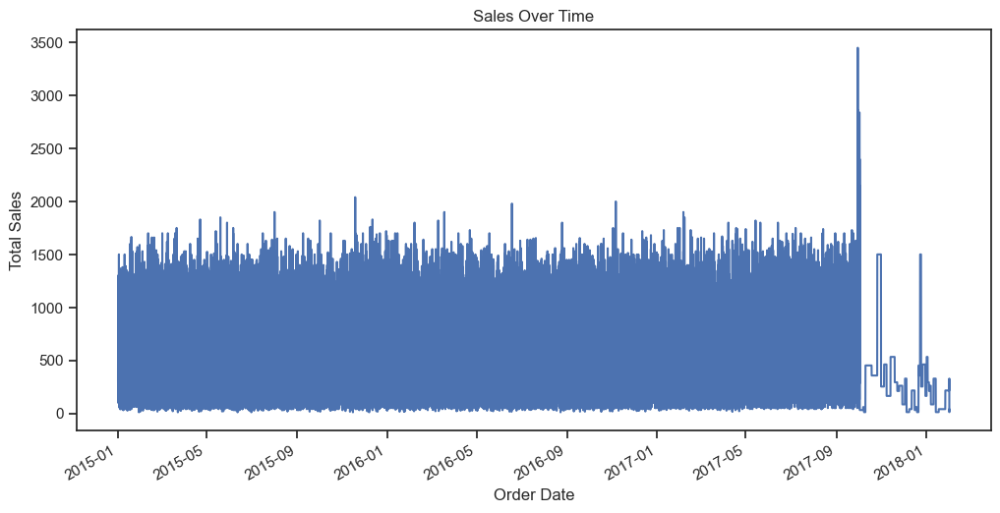

In [64]:
import matplotlib.pyplot as plt

# Group by date and sum the Sales to plot the time series
df_timeseries = df_timeseries_models_features.copy()
df_timeseries['Sales'] = df['Sales']  # Sales is the target variable

# Aggregate Sales by 'order date (DateOrders)'
df_timeseries_agg = df_timeseries.groupby('order date (DateOrders)')['Sales'].sum()

# Plot the time series
plt.figure(figsize=(12, 6))
df_timeseries_agg.plot(title='Sales Over Time')
plt.xlabel('Order Date')
plt.ylabel('Total Sales')
plt.show()


4. Check for Stationarity

In [65]:
from statsmodels.tsa.stattools import adfuller

# Perform ADF test
adf_test = adfuller(df_timeseries_agg)
print(f"ADF Statistic: {adf_test[0]}")
print(f"p-value: {adf_test[1]}")
for key, value in adf_test[4].items():
    print(f'Critical Value ({key}): {value}')


ADF Statistic: -11.25233342306032
p-value: 1.699895238895454e-20
Critical Value (1%): -3.4304495502511467
Critical Value (5%): -2.86158399939813
Critical Value (10%): -2.566793419384098


5. Seasonality and Trend Detection

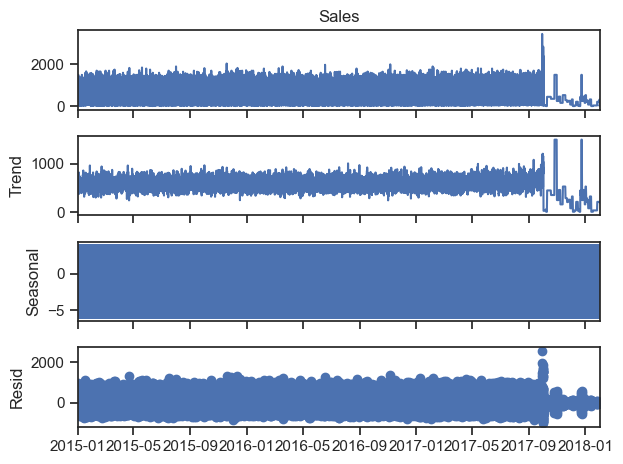

In [66]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the time series
decomposition = seasonal_decompose(df_timeseries_agg, model='additive', period=12)  # Adjust the period based on frequency

# Plot the decomposition
decomposition.plot()
plt.show()


- Analyzing the target variable 'Sales'

a. Visual Inspection of Sales

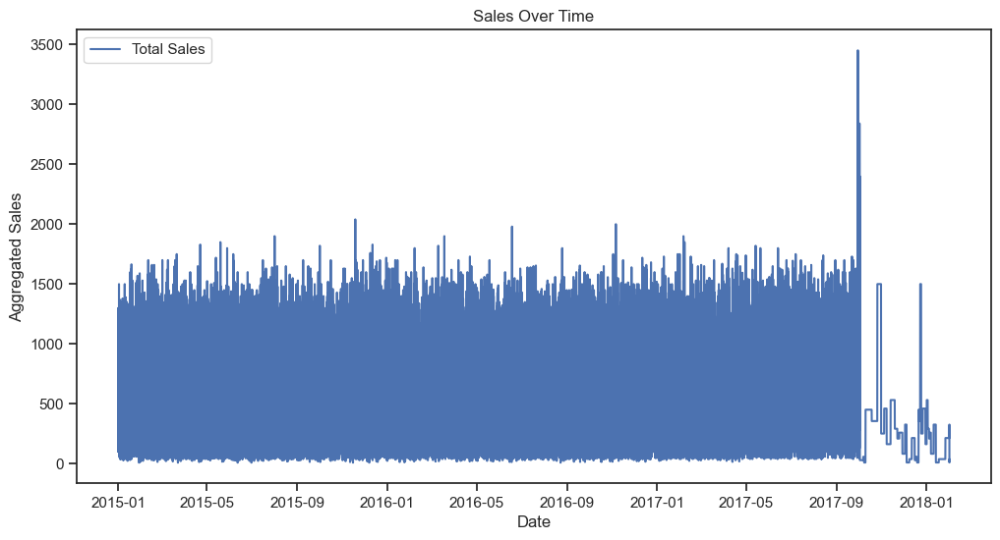

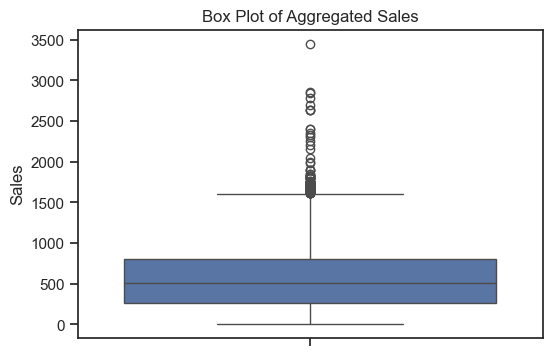

In [67]:
import matplotlib.pyplot as plt

# Plotting the time series of aggregated Sales
plt.figure(figsize=(12, 6))
plt.plot(df_timeseries_agg, label='Total Sales')
plt.title('Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Aggregated Sales')
plt.legend()
plt.show()

# To identify potential outliers visually, a boxplot can be useful
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.boxplot(df_timeseries_agg)
plt.title('Box Plot of Aggregated Sales')
plt.show()


b. Statistical Test for Outliers in Sales

In [68]:
from scipy import stats
import numpy as np

# Calculate the Z-scores of aggregated Sales
z_scores = np.abs(stats.zscore(df_timeseries_agg))
threshold = 3  # commonly used threshold for identifying outliers
outliers_sales = df_timeseries_agg[z_scores > threshold]

print("Outliers based on Z-scores:")
print(outliers_sales)


Outliers based on Z-scores:
order date (DateOrders)
2015-01-19 02:46:00    1664.900040
2015-01-19 08:01:00    1629.790031
2015-02-10 20:57:00    1699.900040
2015-02-15 21:29:00    1659.860046
2015-02-16 05:11:00    1639.890045
2015-02-18 21:39:00    1659.860046
2015-03-02 00:15:00    1699.850021
2015-03-09 14:26:00    1699.880051
2015-03-18 13:12:00    1649.910034
2015-03-19 08:07:00    1699.910050
2015-03-21 10:34:00    1749.860046
2015-04-19 01:15:00    1649.830006
2015-04-22 08:46:00    1829.860031
2015-05-13 14:10:00    1719.900047
2015-05-19 18:01:00    1849.900024
2015-05-28 20:17:00    1799.890045
2015-06-06 02:56:00    1699.790024
2015-06-06 03:59:00    1749.800034
2015-07-16 06:01:00    1699.880051
2015-07-20 10:55:00    1629.900040
2015-07-28 18:37:00    1639.830017
2015-08-01 05:18:00    1899.900055
2015-08-04 15:59:00    1649.800034
2015-08-16 10:43:00    1649.800034
2015-09-08 20:19:00    1699.910050
2015-09-15 18:23:00    1649.820023
2015-09-18 22:24:00    1629.880051
201

- Correlation and Causation

a. Correlation Matrix

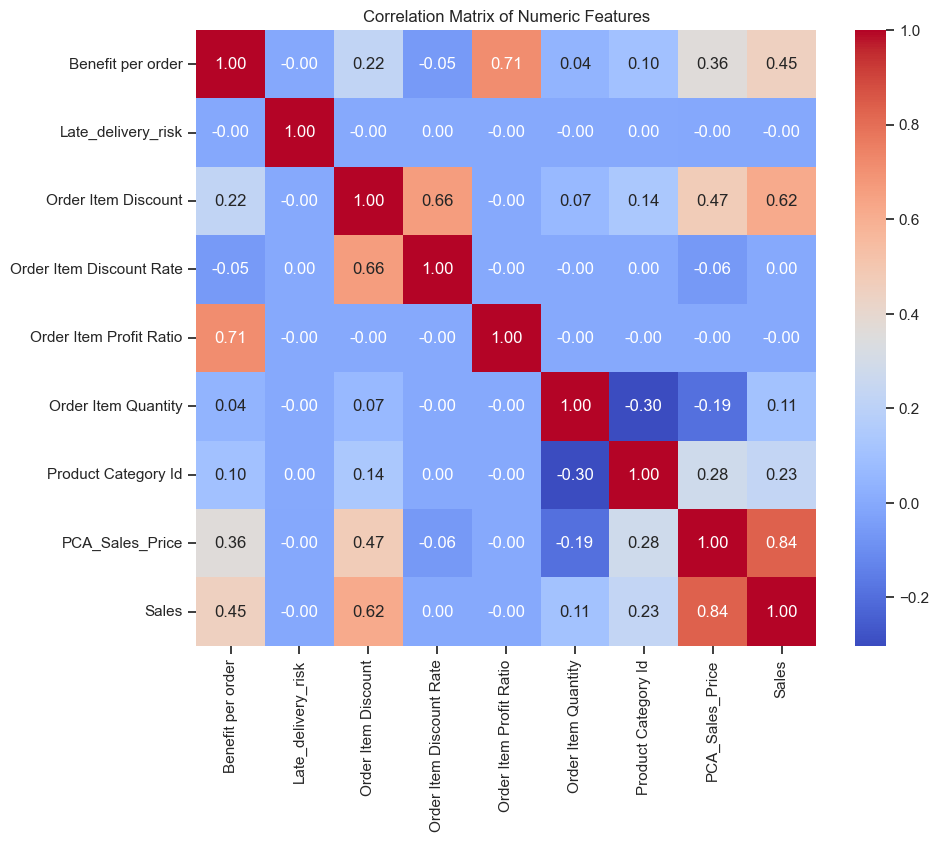

In [69]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Merge the Sales data back to the features DataFrame
df_timeseries_models = pd.DataFrame()
df_timeseries_models = df_timeseries_models_features.copy()
df_timeseries_models['Sales'] = df['Sales']

# Select only numeric columns for correlation
numeric_cols = df_timeseries_models.select_dtypes(include=[np.number])

# Calculate the correlation matrix on numeric columns only
correlation_matrix = numeric_cols.corr()

# Plotting the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Numeric Features')
plt.show()


b. Scatter Plots for Detailed Relationship Visualization

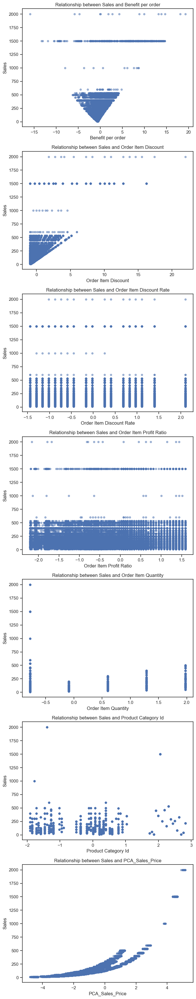

In [70]:
# List of potential exogenous variables you are interested in
variables_of_interest = ['Benefit per order', 'Order Item Discount', 'Order Item Discount Rate', 'Order Item Profit Ratio','Order Item Quantity','Product Category Id','PCA_Sales_Price']  # Add your variable names

# Plotting scatter plots between Sales and each variable
fig, axes = plt.subplots(nrows=len(variables_of_interest), figsize=(7, 5 * len(variables_of_interest)))
for i, var in enumerate(variables_of_interest):
    df_timeseries_models.plot(kind='scatter', x=var, y='Sales', ax=axes[i], alpha=0.5)
    axes[i].set_title(f'Relationship between Sales and {var}')
plt.tight_layout()
plt.show()


- Managing outliers in Sales

In [71]:
import numpy as np

# Merge the Sales data back to the features DataFrame
df_timeseries_models = pd.DataFrame()
df_timeseries_models = df_timeseries_models_features.copy()
df_timeseries_models['Sales'] = df['Sales']

# Apply log transformation and replace negative or zero values with NaN
df_timeseries_models['Log_Sales'] = df_timeseries_models['Sales'].apply(lambda x: np.log(x) if x > 0 else np.nan)


Recehcking after transformation

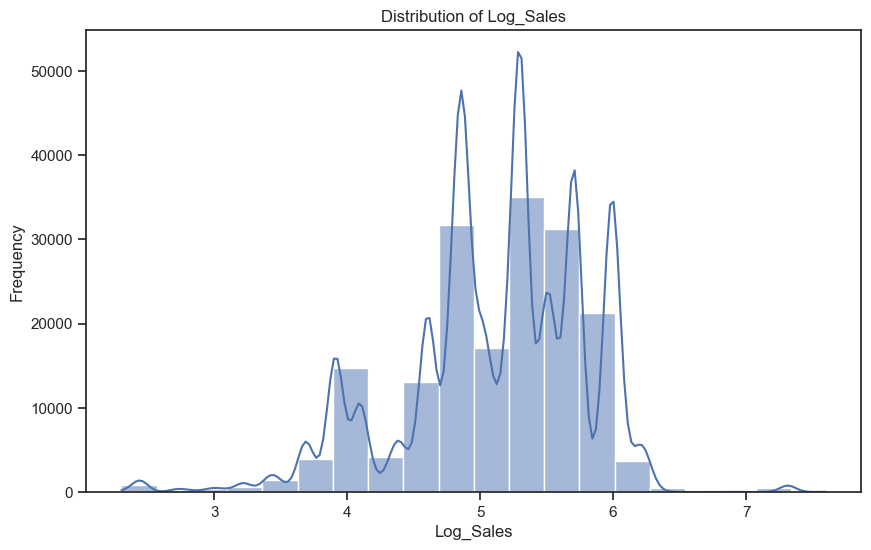

In [72]:
# Check the distribution of Log_Sales
plt.figure(figsize=(10, 6))
sns.histplot(df_timeseries_models['Log_Sales'].dropna(), bins=20, kde=True)
plt.title('Distribution of Log_Sales')
plt.xlabel('Log_Sales')
plt.ylabel('Frequency')
plt.show()

Interpretation:

Multi-modal nature: Since the data is not normally distributed and shows multiple modes, it might imply that different segments of the dataset behave differently. For example, different categories of products or different time periods might be influencing the variation in sales.

Transformation and Modeling: When modeling this data or applying further statistical analysis, the non-normal, multi-modal nature of the distribution should be considered. 
Further Analysis Suggestions:

Cluster Analysis: Consider performing a cluster analysis or using segmentation techniques to identify what differentiates the groups corresponding to each peak.

In [73]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
from scipy.stats import zscore


# Identify outliers based on z-score of Log_Sales
df_timeseries_models['Log_Sales_Z'] = zscore(df_timeseries_models['Log_Sales'].fillna(df_timeseries_models['Log_Sales'].mean()))
outliers_log_sales = df_timeseries_models[np.abs(df_timeseries_models['Log_Sales_Z']) > 3]
outliers_selected = outliers_log_sales[['Sales', 'Log_Sales', 'order date (DateOrders)']]
print("Outliers based on z-score of Log_Sales:")
print(outliers_selected)

Outliers based on z-score of Log_Sales:
             Sales  Log_Sales order date (DateOrders)
152     1500.00000   7.313220     2017-10-29 12:55:00
155     1500.00000   7.313220     2017-10-30 01:10:00
160     1500.00000   7.313220     2017-10-26 14:51:00
172     1500.00000   7.313220     2017-10-26 18:21:00
1353    1500.00000   7.313220     2017-10-27 19:55:00
1370    1500.00000   7.313220     2017-10-29 17:07:00
1375    1500.00000   7.313220     2017-10-29 16:25:00
1504      19.99000   2.995232     2016-11-28 03:24:00
1508      19.99000   2.995232     2015-08-31 13:19:00
1590      11.29000   2.423917     2017-10-08 09:16:00
1591      11.29000   2.423917     2017-10-08 15:13:00
1594    1500.00000   7.313220     2017-10-30 10:17:00
2348      15.99000   2.771964     2016-08-27 03:42:00
2353      15.99000   2.771964     2015-12-31 21:12:00
2358      19.99000   2.995232     2016-10-22 09:56:00
2361      19.99000   2.995232     2016-01-14 02:16:00
2362      15.99000   2.771964     2015-12-

In [74]:
nan_count_log_sales = df_timeseries_models['Log_Sales'].isna().sum()
print(nan_count_log_sales)

0


Correlation matrix:
                          Benefit per order  Order Item Discount  Order Item Discount Rate  Order Item Profit Ratio  Order Item Quantity  Product Category Id  PCA_Sales_Price  Log_Sales
Benefit per order                  1.000000             0.224566                 -0.053448                 0.711889             0.038490             0.102760         0.360119   0.368538
Order Item Discount                0.224566             1.000000                  0.659955                -0.001232             0.065379             0.140180         0.472660   0.536048
Order Item Discount Rate          -0.053448             0.659955                  1.000000                -0.002141            -0.000028             0.000572        -0.063209   0.000129
Order Item Profit Ratio            0.711889            -0.001232                 -0.002141                 1.000000            -0.000072            -0.001440        -0.001025  -0.001218
Order Item Quantity                0.038490       

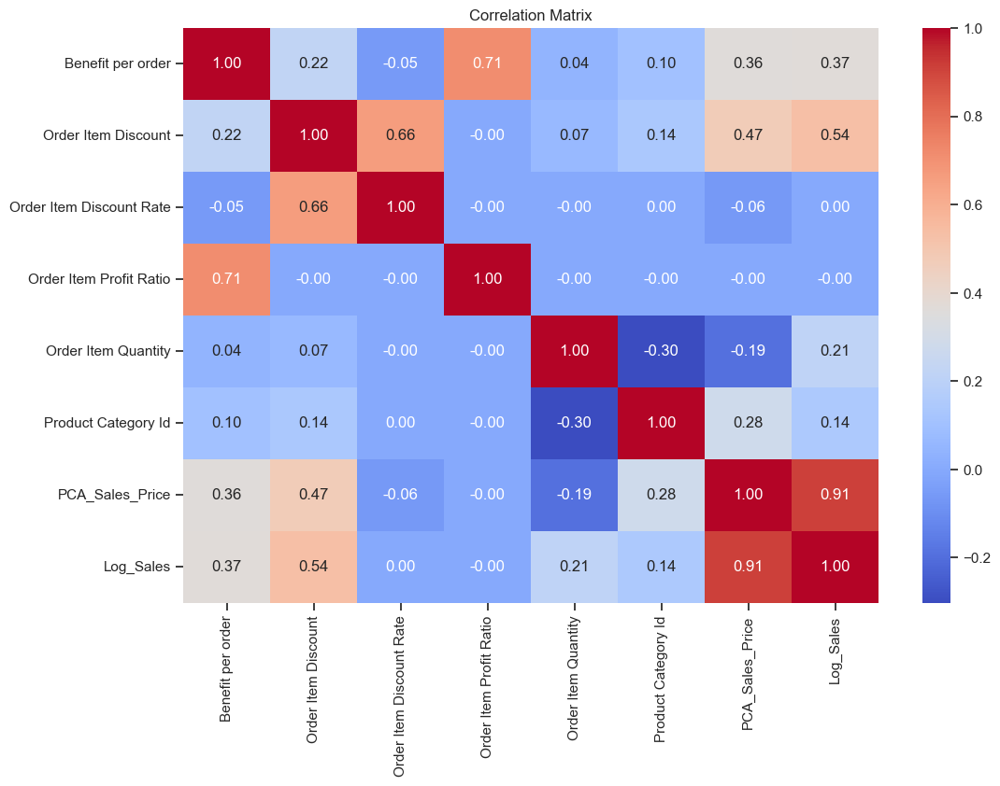

In [75]:
# Correlation matrix of specified columns
columns_of_interest = [
    'Benefit per order', 'Order Item Discount', 'Order Item Discount Rate',
    'Order Item Profit Ratio', 'Order Item Quantity', 'Product Category Id',
    'PCA_Sales_Price', 'Log_Sales'
]
correlation_matrix = df_timeseries_models[columns_of_interest].corr()
print("Correlation matrix:")
print(correlation_matrix)

# Plotting the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

Interpretation:
Strong Correlations:

PCA_Sales_Price and Log_Sales have a very high correlation of 0.913. This suggests that as the PCA-adjusted sales price increases, the log-transformed sales also tend to increase substantially. This could indicate a strong direct influence of sales price on sales volume when adjusted for principal component analysis.

Order Item Discount and Log_Sales have a substantial correlation of 0.536. Higher discounts seem to be associated with higher sales, which could suggest that discounts drive sales volumes.

Moderate Correlations:

Benefit per order and Order Item Profit Ratio are correlated at 0.712, indicating a strong linkage between the benefits obtained per order and the profit ratio. This might suggest that orders with higher benefits tend to also have higher profit ratios.

Order Item Discount and Order Item Discount Rate have a strong correlation of 0.660, indicating that as the discount rate increases, the absolute discount value also increases.

Order Item Discount and PCA_Sales_Price share a correlation of 0.473, suggesting that higher discounts might be offered on items with higher PCA-adjusted sales prices.

 Moderate correlations across different variables suggest that different product categories and order characteristics might influence sales differently. This might warrant segment-specific strategies to optimize benefits and discounts.

 Segmented Analysis: Given the different behavior of various categories and profit ratios, it might be beneficial to perform segmented analyses, possibly by product category, to tailor strategies appropriately.

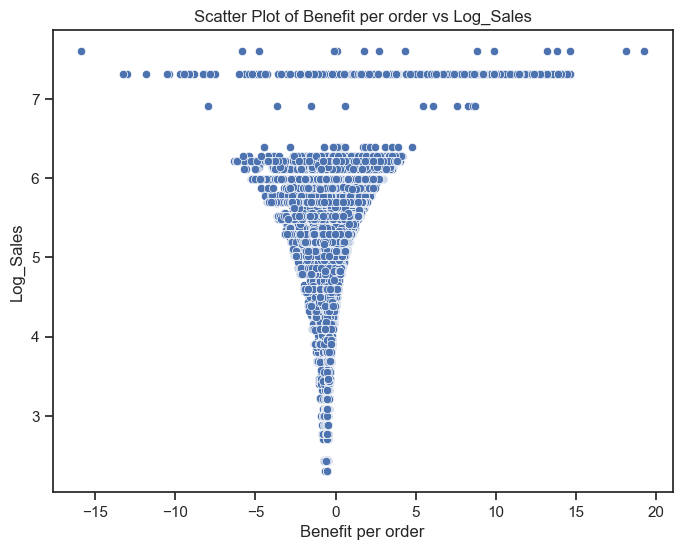

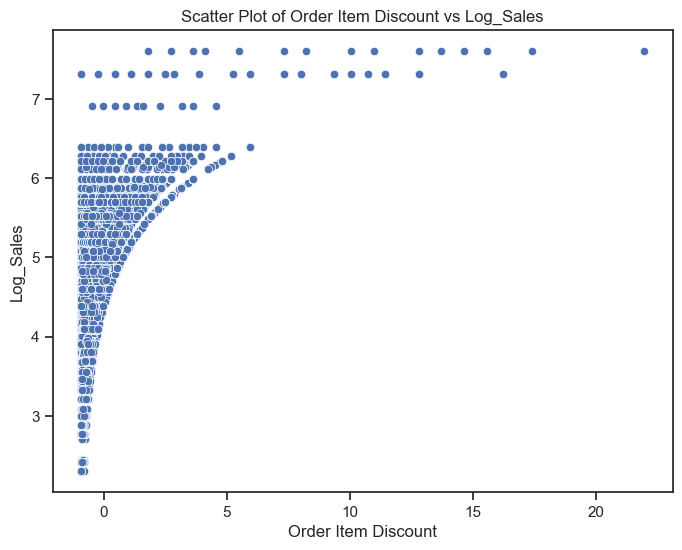

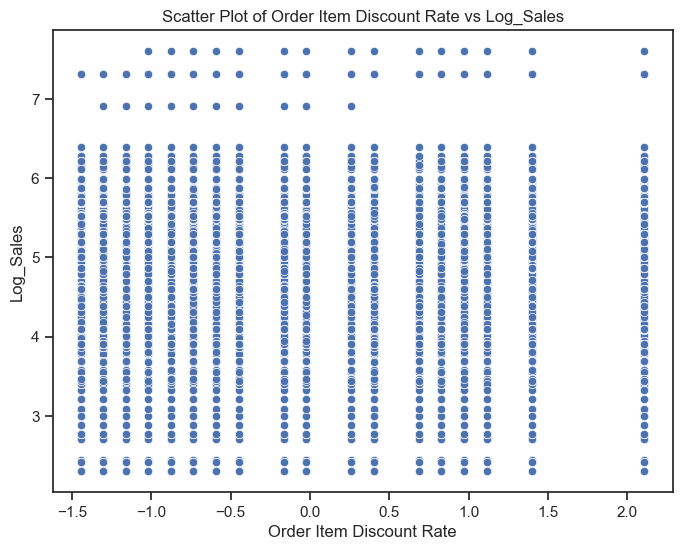

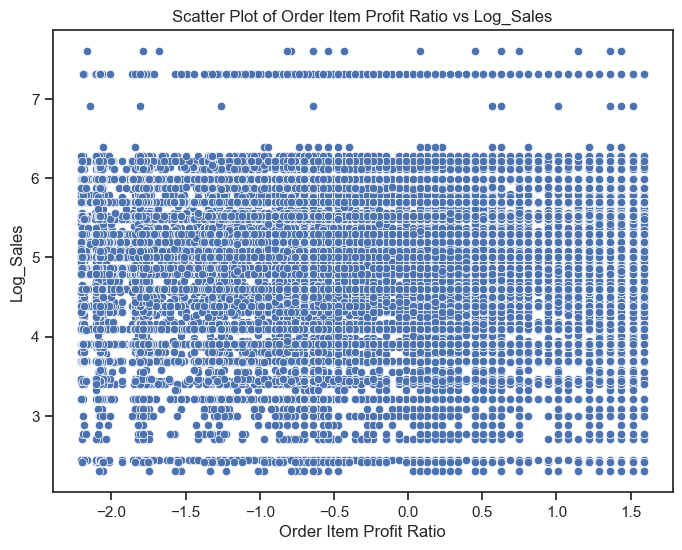

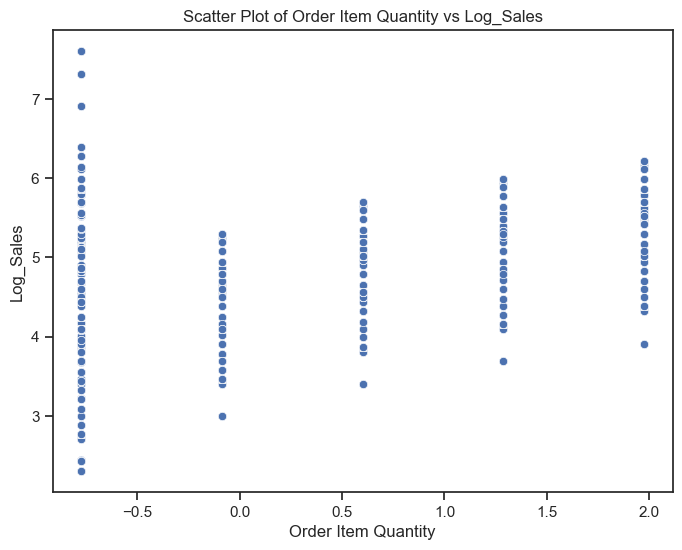

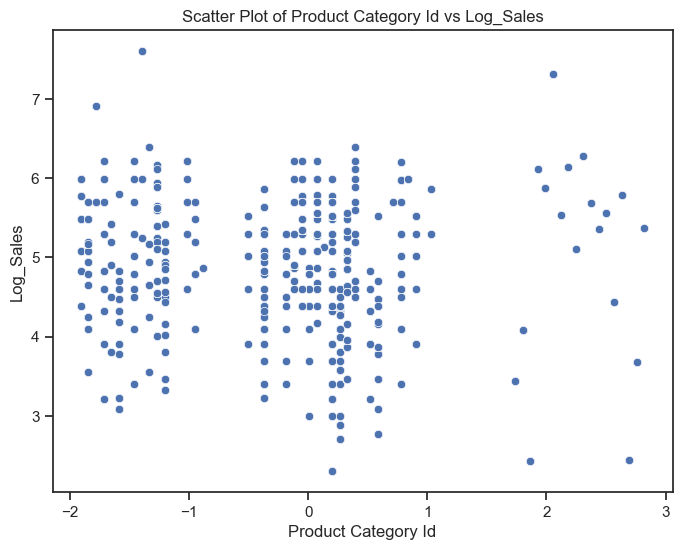

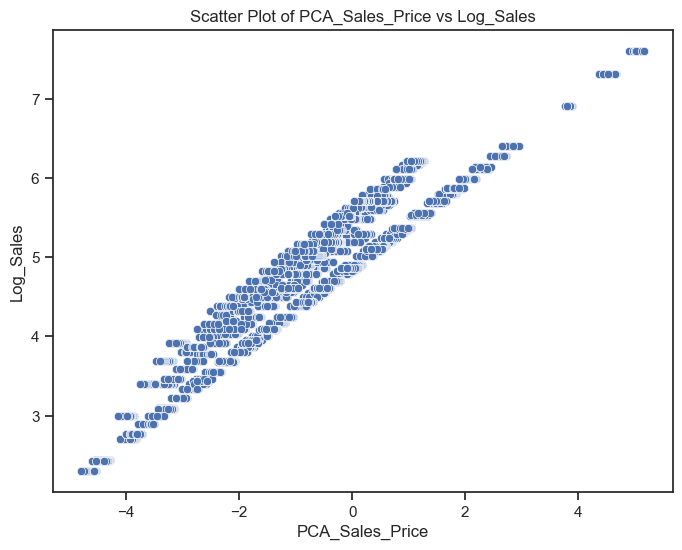

In [76]:
# Scatter plot of specified columns with Log_Sales
for column in columns_of_interest[:-1]:  # Exclude 'Log_Sales' itself
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df_timeseries_models, x=column, y='Log_Sales')
    plt.title(f'Scatter Plot of {column} vs Log_Sales')
    plt.xlabel(column)
    plt.ylabel('Log_Sales')
    plt.show()

Interpretation:

Key Variables of Interest:

PCA_Sales_Price: With a high correlation of 0.913 with Log_Sales, PCA_Sales_Price is a critical predictor. This suggests a strong direct relationship between sales prices adjusted for principal components and sales volumes.

Order Item Discount: Shows a substantial correlation of 0.536 with Log_Sales. This indicates that discounts can significantly influence sales, and adjusting discounts might be an effective way to manage sales volumes over time.

Recommendations for Time Series Analysis:

Feature Engineering:

Lag Variables: Given the strong relationships observed, consider creating lagged variables of PCA_Sales_Price and Order Item Discount to capture temporal dynamics that influence Log_Sales.

Rolling Averages: Utilize rolling averages of prices and discounts to smooth out short-term fluctuations and capture longer-term trends.

Seasonal Adjustments: If there are seasonal patterns in Log_Sales, which might be indicated by fluctuations corresponding to specific times (e.g., holidays, promotional periods), incorporating seasonal dummies or using seasonal adjustment techniques would be beneficial.

Model Selection:

ARIMA/SARIMA Models: Given the time series nature of sales data, ARIMA (Autoregressive Integrated Moving Average) models, especially SARIMA (Seasonal ARIMA) if seasonality is present, would be suitable for modeling Log_Sales. These models can effectively incorporate the lagged effects of sales, price, and discount.

Regression with ARMA Errors: To directly incorporate the effects of variables like PCA_Sales_Price and Order Item Discount into a time series model, consider using a regression model with ARMA errors.

Variable Importance and Interaction:

Explore interactions between PCA_Sales_Price and Order Item Discount to assess if the impact of discounts on sales is moderated by the price levels. This can reveal more nuanced insights into pricing strategies.

Anomaly Detection:

Given the presence of outliers as seen in the scatter plots, integrating anomaly detection before modeling could help in identifying and handling extreme values which might distort model estimations.

In [77]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt


# Merge the Sales data back to the features DataFrame
df_timeseries_models = pd.DataFrame()
df_timeseries_models = df_timeseries_models_features.copy()
df_timeseries_models['Sales'] = df['Sales']

# Group by 'DateOrders' and sum 'Sales' to remove duplicate dates
df_timeseries_models = df_timeseries_models.groupby('order date (DateOrders)')['Sales'].sum().reset_index()

aggregated_sales =df_timeseries_models.copy()

# Apply log transformation and replace negative or zero values with NaN
aggregated_sales['Log_Sales'] = df_timeseries_models['Sales'].apply(lambda x: np.log(x) if x > 0 else np.nan)

# Sort the DataFrame by the date index to ensure monotonicity
aggregated_sales = aggregated_sales.sort_values('order date (DateOrders)')

# Set the date column as the index for time series analysis
aggregated_sales = aggregated_sales.set_index('order date (DateOrders)')


# Sort the DataFrame by the date index to ensure monotonicity
df_timeseries_models = df_timeseries_models.sort_values('order date (DateOrders)')

# Set the date column as the index for time series analysis
df_timeseries_models = df_timeseries_models.set_index('order date (DateOrders)')



In [78]:
# Ensure the index is a DatetimeIndex and set a frequency

aggregated_sales = aggregated_sales.asfreq('d')
aggregated_sales = aggregated_sales.fillna(method='ffill')
aggregated_sales = aggregated_sales.fillna(method='bfill')

df_timeseries_models = df_timeseries_models.asfreq('d')  # Adjust frequency as needed
df_timeseries_models = df_timeseries_models.fillna(method='ffill')
df_timeseries_models = df_timeseries_models.fillna(method='bfill')



C:\Users\CZ0068\AppData\Local\Temp\ipykernel_16468\3085203404.py:4: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  aggregated_sales = aggregated_sales.fillna(method='ffill')
C:\Users\CZ0068\AppData\Local\Temp\ipykernel_16468\3085203404.py:5: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  aggregated_sales = aggregated_sales.fillna(method='bfill')
C:\Users\CZ0068\AppData\Local\Temp\ipykernel_16468\3085203404.py:8: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_timeseries_models = df_timeseries_models.fillna(method='ffill')
C:\Users\CZ0068\AppData\Local\Temp\ipykernel_16468\3085203404.py:9: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() in

In [79]:
# Optionally check if any NaN remains
print(df_timeseries_models.isna().sum())

Sales    0
dtype: int64


In [80]:
# Optionally check if any NaN remains
print(aggregated_sales.isna().sum())

Sales        0
Log_Sales    0
dtype: int64


In [81]:
df_timeseries_models.shape

(1127, 1)

In [82]:
aggregated_sales.shape

(1127, 2)

In [83]:
print("Start date:", df_timeseries_models.index.min())
print("End date:", df_timeseries_models.index.max())


Start date: 2015-01-01 00:00:00
End date: 2018-01-31 00:00:00


In [84]:
date_range = pd.date_range(start=df_timeseries_models.index.min(), end=df_timeseries_models.index.max())
print("Expected number of days:", len(date_range))
print("Actual rows in DataFrame:", len(df_timeseries_models))


Expected number of days: 1127
Actual rows in DataFrame: 1127


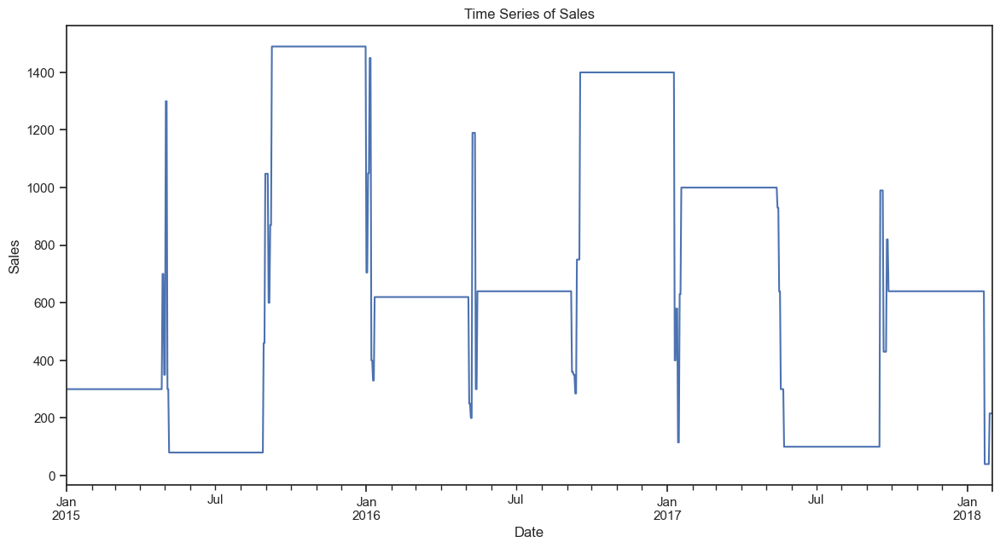

In [85]:
import matplotlib.pyplot as plt

# Line plot for trend analysis
df_timeseries_models['Sales'].plot(figsize=(14, 7))
plt.title('Time Series of Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()


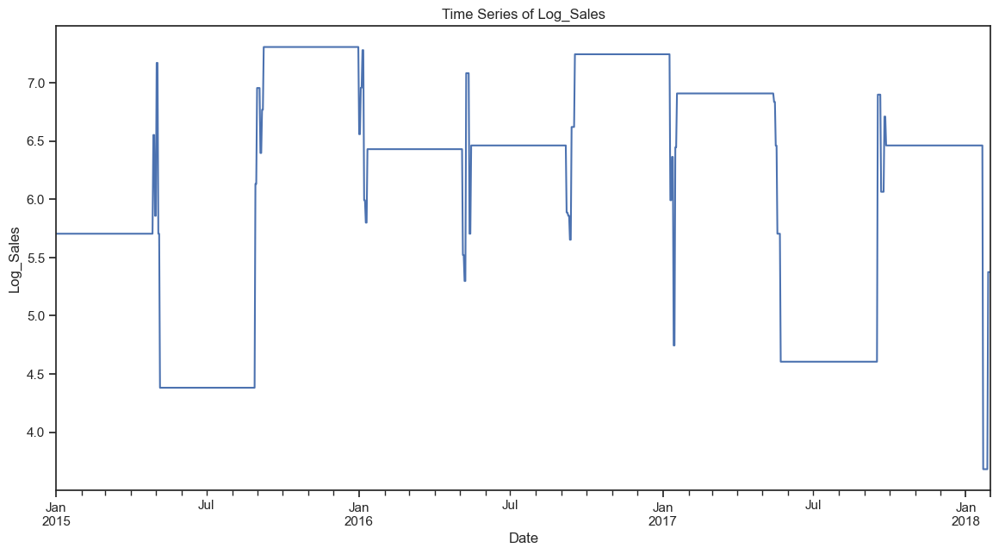

In [86]:
import matplotlib.pyplot as plt

# Line plot for trend analysis
aggregated_sales['Log_Sales'].plot(figsize=(14, 7))
plt.title('Time Series of Log_Sales')
plt.xlabel('Date')
plt.ylabel('Log_Sales')
plt.show()

Interpretation of the Plot

Seasonal Patterns: The spikes and sharp declines suggest a possible seasonal influence on sales. For example, if this is retail data, these spikes might align with holiday seasons or sales events, followed by quieter periods.

Sharp Drops and Recoveries: The abrupt falls to near-zero levels followed by quick recoveries could indicate periods when sales activities are halted—possibly due to external factors like stockouts, business closures for holidays, or system reporting issues.

Yearly Trends: Each year appears to show similar patterns, which strengthens the case for significant seasonal effects or annual sales cycles.

Recommendations for Analysis:

Seasonal Decomposition: Conduct a seasonal decomposition to confirm and quantify the seasonal effects observed in the plot. This can help in understanding the magnitude and timing of seasonal variations.

Stationarity Check: Check for stationarity using the Augmented Dickey-Fuller test or KPSS test to determine if the series needs differencing to make it stationary, which is a requirement for ARIMA modeling.

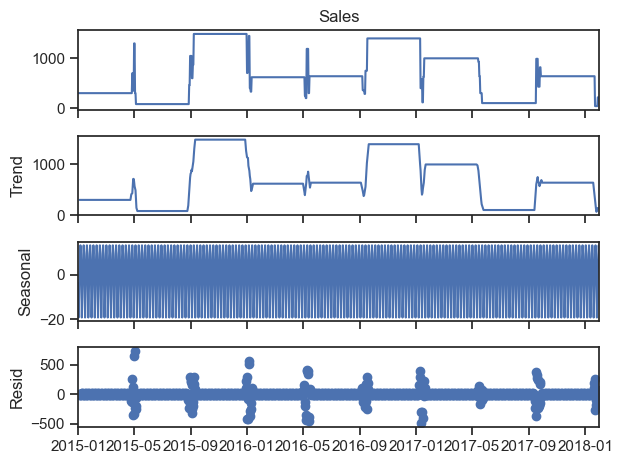

In [87]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(df_timeseries_models['Sales'], model='additive')
decomposition.plot()
plt.show()


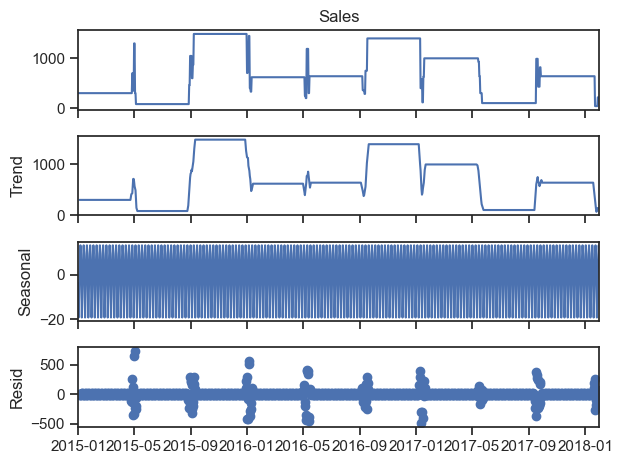

In [88]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(aggregated_sales['Sales'], model='additive')
decomposition.plot()
plt.show()

In [89]:
from statsmodels.tsa.stattools import adfuller
test_result = adfuller(df_timeseries_models['Sales'])
print('ADF Statistic:', test_result[0])
print('p-value:', test_result[1])


ADF Statistic: -2.397867688408506
p-value: 0.14233914255793756


In [90]:
from statsmodels.tsa.stattools import adfuller
test_result = adfuller(aggregated_sales['Log_Sales'])
print('ADF Statistic:', test_result[0])
print('p-value:', test_result[1])


ADF Statistic: -2.413577348044455
p-value: 0.13794091484242532


Interpretation of Seasonal Decomposition:

The decomposition into trend, seasonal, and residual components shows:

Sales and Trend: Both the original sales and the trend component exhibit sharp rises and drops. The trend component, however, smooths out some of the more abrupt changes, indicating that these could be due to regular fluctuations or outliers.

Periods of flat, near-zero sales suggest either off-seasons, data collection issues, or business closures.

Seasonal: The seasonal component shows a very high frequency of fluctuations within each year, indicating significant within-year variability that repeats annually. This rapid oscillation suggests the presence of micro-seasonal effects (potentially daily or weekly) that are consistent over time.

Residuals: The residuals, which represent the portion of the sales not explained by the trend or seasonality, appear mostly random and centered around zero. However, there are a few large spikes, which could represent unmodeled influences or anomalies in the data.

Stationarity Check:

ADF Test Results:

ADF Statistic: -2.397867688408506

p-value: 0.14233914255793756

The p-value is greater than the common threshold of 0.05, indicating that the series is not stationary. This means there is a unit root present in the series, implying that the series may have properties such as trend or seasonality that depend on time.

Recommendations:

Differencing:

Since the data is not stationary, we consider differencing the series to remove trends and/or seasonal effects. Starting with first differencing and check stationarity again. If the data remains non-stationary, consider seasonal differencing given the clear seasonal pattern observed.

In [91]:
# First differencing
df_timeseries_models['Sales_diff'] = df_timeseries_models['Sales'].diff().dropna()

# Check stationarity again
result_diff = adfuller(df_timeseries_models['Sales_diff'].dropna())
print('ADF Statistic:', result_diff[0])
print('p-value:', result_diff[1])


ADF Statistic: -22.741892950080352
p-value: 0.0


In [92]:
# First differencing
aggregated_sales['Log_Sales_diff'] = aggregated_sales['Log_Sales'].diff().dropna()

# Check stationarity again
result_diff = adfuller(aggregated_sales['Log_Sales_diff'].dropna())
print('ADF Statistic:', result_diff[0])
print('p-value:', result_diff[1])


ADF Statistic: -17.070496061798515
p-value: 7.831611584468338e-30


Interpretation of ADF Test Results After Differencing:

Strong Rejection of the Null Hypothesis:

The ADF statistic is significantly below any typical critical value, and the p-value is effectively zero. This strongly suggests that the differenced series is stationary.
Rejecting the null hypothesis implies there is no unit root in the differenced series, and the series does not depend on time in a way that would prevent reliable predictions.

Implications for Time Series Modeling:  Achieving stationarity is a crucial prerequisite for many time series forecasting methods, including ARIMA and SARIMA models. Stationarity implies that the properties of the series such as mean and variance do not change over time, making the series more predictable.

Next Steps in Modeling: Given the stationarity of the differenced data, we can proceed with confidence to develop time series forecasting models. 

Model Specification: We can specify a SARIMA model without needing further differencing. The parameters for the SARIMA model can now focus more on the MA (Moving Average) and AR (Autoregressive) parts, as the differencing component has been addressed.

The seasonal elements of the SARIMA model should be determined based on the frequency and amplitude of seasonal patterns observed earlier in the seasonal decomposition.

Fit SARIMA Model:

Given the presence of clear seasonal patterns previously identified, fit a SARIMA model that accounts for both the non-seasonal and seasonal aspects.


In [93]:
import pmdarima as pm

# Assuming the seasonal period is 12 (e.g., monthly data with yearly seasonality)
sarima_model = pm.auto_arima(df_timeseries_models['Sales'], 
                             seasonal=True, m=12, 
                             d=1, D=1,   # non-seasonal and seasonal differencing
                             start_p=0, start_q=0, max_p=3, max_q=3,
                             start_P=0, start_Q=0, max_P=2, max_Q=2,
                             trace=True, error_action='ignore', 
                             suppress_warnings=True, stepwise=True)

print(sarima_model.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=14240.578, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=13933.695, Time=1.01 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=14242.578, Time=0.02 sec


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1898: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,0)(2,1,0)[12]             : AIC=13810.354, Time=3.81 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=79.94 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.73 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=13808.354, Time=3.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=13931.695, Time=0.81 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=69.32 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=1.71 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=13810.354, Time=4.36 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=inf, Time=85.64 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=13810.342, Time=72.31 sec

Best model:  ARIMA(0,1,0)(2,1,0)[12]          
Total fit time: 326.571 seconds
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                 1127
Model:             SARIMAX(0, 1, 0)x(2, 1, 0, 12)   Log Likelihood               -69

The results from  SARIMA model fitting process and the output from the final selected model indicate that we have a model that fits the data relatively well based on the AIC criterion and the significance of the coefficients.

1. Model Evaluation
The best model obtained is SARIMAX(0, 1, 0)x(2, 1, 0, 12), which indicates:

No autoregressive (AR) or moving average (MA) components for the non-seasonal part.

Two autoregressive components for the seasonal part with a period of 12 (this would be yearly seasonality).

Given this model, we should:

Review Diagnostic Plots: Check the residuals of SARIMA model to ensure that they resemble white noise (i.e., normally distributed, mean zero, constant variance, and no autocorrelation).

In [93]:
import pmdarima as pm

# Assuming the seasonal period is 12 (e.g., monthly data with yearly seasonality)
sarima_model_log_sales = pm.auto_arima(aggregated_sales['Log_Sales'], 
                             seasonal=True, m=12, 
                             d=1, D=1,   # non-seasonal and seasonal differencing
                             start_p=0, start_q=0, max_p=3, max_q=3,
                             start_P=0, start_Q=0, max_P=2, max_Q=2,
                             trace=True, error_action='ignore', 
                             suppress_warnings=True, stepwise=True)

print(sarima_model_log_sales.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=323.353, Time=0.12 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=54.542, Time=0.88 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.03 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=325.353, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-50.403, Time=4.10 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=66.91 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=4.66 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-52.403, Time=2.98 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=52.542, Time=0.61 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=55.80 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=2.71 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-50.403, Time=4.16 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-48.403, Time=4.74 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=-50.423, Time=55.21 sec

Best model:  ARIMA(0,1,0)(2,1,0)[12]          
Tota

Comparing the two SARIMA models—before and after the log transformation of Sales—provides valuable insights into how transformations can significantly impact the model fit and its diagnostics. 

Comparison of SARIMA Model Fits

1. Model Performance Metrics (AIC):

Pre-Transformation: The best AIC obtained was 13808.354 with the model SARIMAX(0,1,0)x(2,1,0)[12].

Post-Log Transformation: The best AIC was significantly lower at -52.403 with the same model configuration SARIMAX(0,1,0)x(2,1,0)[12].

Interpretation:

The dramatic decrease in AIC post-transformation suggests that the log transformation helped in stabilizing the variance and making the model more efficient. Lower AIC values typically indicate a better model fit to the data, considering both the goodness of fit and the complexity of the model.

2. Residual Analysis:

Pre-Transformation: The residuals were non-normally distributed with significant kurtosis (as indicated by the high Jarque-Bera statistic) and possible heteroskedasticity (uneven variance across time).

Post-Log Transformation: Residuals still show signs of non-normality but the heteroskedasticity appears to be better managed, as indicated by a lower heteroskedasticity test statistic (H) and a slightly improved distribution in the histogram.

3. Seasonal Components:

In both cases, the seasonal AR components are significant, indicating strong seasonal patterns in the data. The coefficients for these components were very similar in both pre and post-transformation models, suggesting that the seasonal dynamics of the series were preserved even after the transformation.

4. Ljung-Box and Jarque-Bera Test Results:

Pre-Transformation: High JB statistic suggests heavy tails and possibly outliers.

Post-Log Transformation: JB statistic is still high, indicating persistent issues with the tail behavior of the residuals.

Next Steps:

Address Residual Issues:

Although the log transformation improved the model fit (as evidenced by AIC), the residuals still exhibit non-normal behavior. Further transformations or the inclusion of additional terms in the model might be required. 

Consider Box-Cox transformations or adding moving average components to capture any residual autocorrelation not addressed by the seasonal differencing.

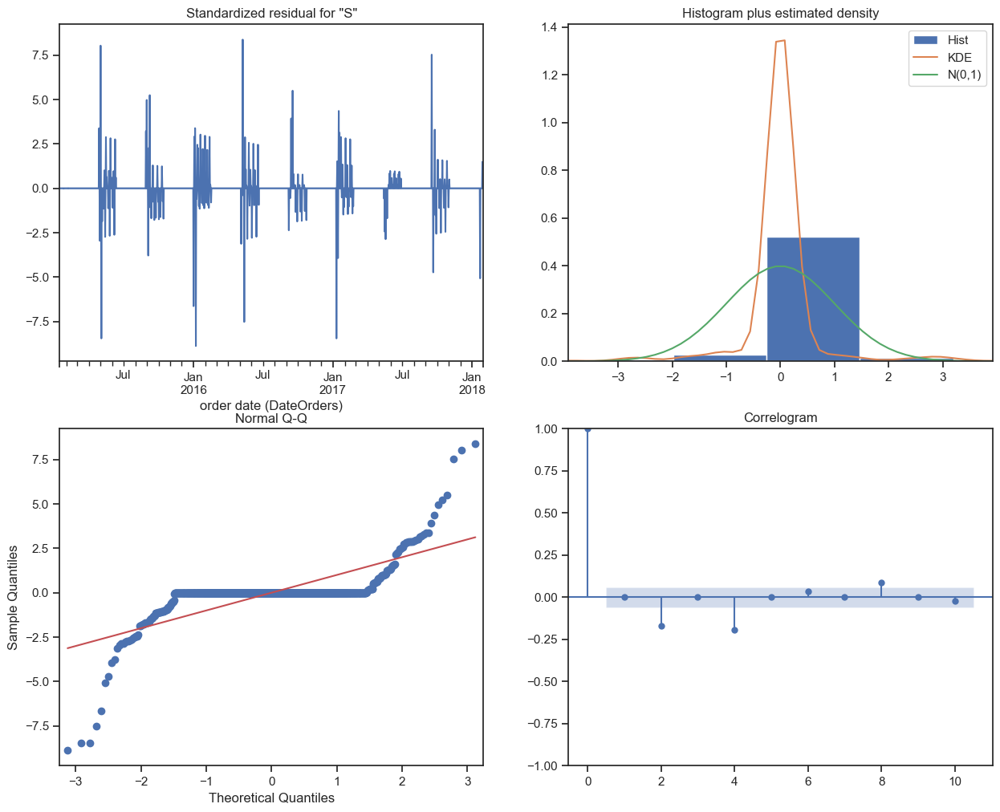

In [95]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Fit the best SARIMA model
model = sm.tsa.statespace.SARIMAX(df_timeseries_models['Sales'], order=(0, 1, 0), seasonal_order=(2, 1, 0, 12))
results = model.fit()

# Plot the diagnostics
results.plot_diagnostics(figsize=(15, 12))
plt.show()


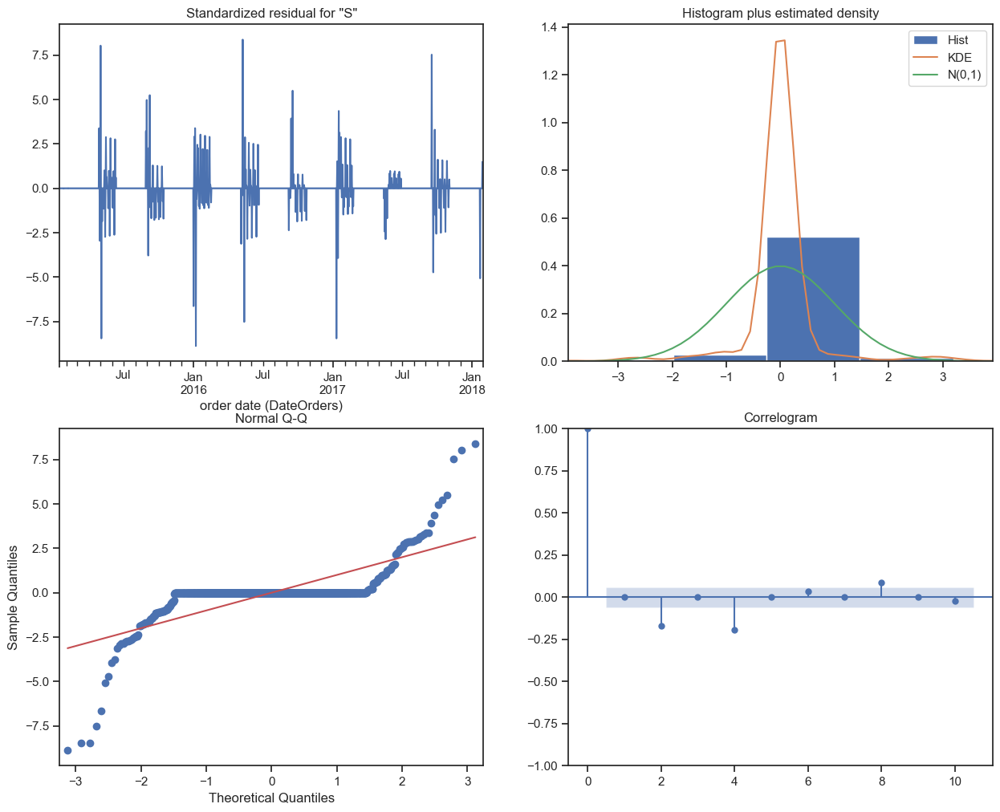

In [96]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Fit the best SARIMA model
model_log_sales = sm.tsa.statespace.SARIMAX(aggregated_sales['Log_Sales'], order=(0, 1, 0), seasonal_order=(2, 1, 0, 12))
results_log_sales = model.fit()

# Plot the diagnostics
results_log_sales.plot_diagnostics(figsize=(15, 12))
plt.show()


The comparison of the diagnostic plots for both SARIMA models (before and after log transformation) can provide insights into how the transformation influenced the residuals and overall model fit. 

Standardized Residuals Plot:

Both Cases: The plots show residuals fluctuating around zero without clear patterns, which is positive as it indicates no autocorrelation issues. However, there are numerous outliers in both cases, suggesting occasional large deviations from the model predictions.

Histogram and Kernel Density Estimate (KDE) Plot:

Both Cases: The histograms for both models show that the residuals are not normally distributed. The KDE does not align with the green normal distribution curve, particularly in the tails. This indicates that the residuals have heavy tails and are skewed.

Q-Q Plot:

Both Cases: The Q-Q plots in both cases indicate that the residuals deviate from the theoretical quantiles, especially in the tails. This is another indication of non-normality, with the residuals exhibiting heavier tails than would be expected under a normal distribution.

Correlogram (ACF Plot):

Both Cases: The autocorrelation function plots show that the autocorrelations for various lags are mostly within the confidence bounds, suggesting no significant autocorrelation issues. This implies that the models are adequately capturing the temporal dependencies in the data.

Analysis and Interpretation: 

Transformation Impact: The log transformation does not seem to have significantly altered the nature of the residuals in terms of autocorrelation and normality. In both cases, the models handle autocorrelation well, but struggle with the non-normality of residuals.

Residual Outliers: The presence of outliers in both models suggests that there may be extreme values or anomalies in the sales data that the models are not capturing. This could be due to inherent volatility in the data or external shocks not accounted for by the model.

Recommendations:

Alternative Transformations: Since the log transformation did not fully address the issues with residual distribution, consider other transformations, such as Box-Cox or Movigng Average which might better stabilize variance and achieve normality.

Now Trying with Box Cox and Movign Average Transformation of Sales.

Fitted lambda for Box-Cox transformation: 0.5270136564457502


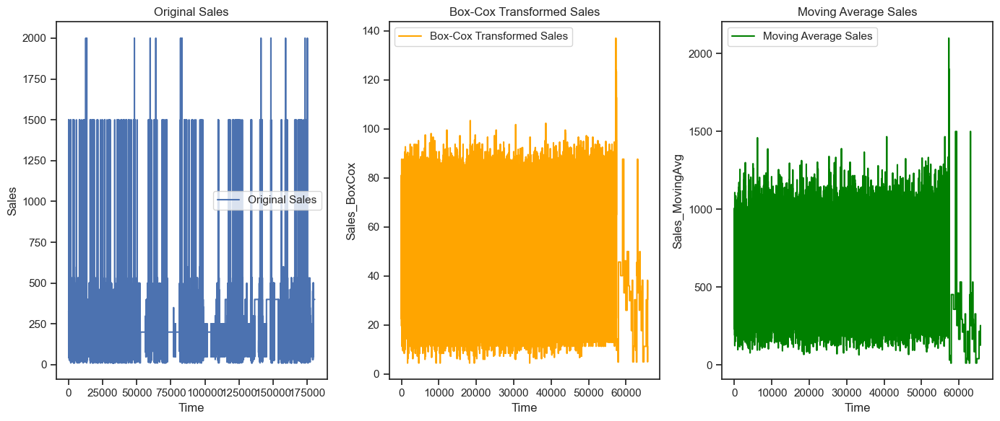

In [128]:
import pandas as pd
import numpy as np
from scipy.stats import boxcox
import matplotlib.pyplot as plt

# Assuming df and df_timeseries_models_features are already defined

# Merge the Sales data back to the features DataFrame
df_timeseries_box_cox = pd.DataFrame()
df_timeseries_box_cox = df_timeseries_models_features.copy()
df_timeseries_box_cox['Sales'] = df['Sales']

df_timeseries_ma = pd.DataFrame()
df_timeseries_ma = df_timeseries_models_features.copy()
df_timeseries_ma['Sales'] = df['Sales']

# Group by 'DateOrders' and sum 'Sales' to remove duplicate dates
df_timeseries_box_cox = df_timeseries_box_cox.groupby('order date (DateOrders)')['Sales'].sum().reset_index()

# Group by 'DateOrders' and sum 'Sales' to remove duplicate dates
df_timeseries_ma = df_timeseries_ma.groupby('order date (DateOrders)')['Sales'].sum().reset_index()


# Apply Box-Cox transformation to the Sales data in df_timeseries_box_cox
df_timeseries_box_cox['Sales_BoxCox'], fitted_lambda = boxcox(df_timeseries_box_cox['Sales'] + 1e-6)

# Display the lambda used for the Box-Cox transformation
print(f"Fitted lambda for Box-Cox transformation: {fitted_lambda}")

# Apply Moving Average transformation to the Sales data in df_timeseries_ma
window_size = 3  # Define the window size for the moving average
df_timeseries_ma['Sales_MovingAvg'] = df_timeseries_ma['Sales'].rolling(window=window_size, center=True).mean()

# Drop NaN values resulting from moving average calculation
df_timeseries_ma.dropna(subset=['Sales_MovingAvg'], inplace=True)

# Plotting the original and transformed Sales data
plt.figure(figsize=(14, 6))

# Plot original Sales
plt.subplot(1, 3, 1)
plt.plot(df_timeseries['Sales'], label='Original Sales')
plt.title('Original Sales')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()

# Plot Box-Cox transformed Sales
plt.subplot(1, 3, 2)
plt.plot(df_timeseries_box_cox['Sales_BoxCox'], label='Box-Cox Transformed Sales', color='orange')
plt.title('Box-Cox Transformed Sales')
plt.xlabel('Time')
plt.ylabel('Sales_BoxCox')
plt.legend()

# Plot Moving Average transformed Sales
plt.subplot(1, 3, 3)
plt.plot(df_timeseries_ma['Sales_MovingAvg'], label='Moving Average Sales', color='green')
plt.title('Moving Average Sales')
plt.xlabel('Time')
plt.ylabel('Sales_MovingAvg')
plt.legend()

plt.tight_layout()
plt.show()



Interpretation:

Box-Cox Transformed Sales: The transformed data appears more uniform compared to the original, which is a good sign for certain modeling techniques that assume homoscedasticity (constant variance). The scale difference suggests the transformation was successful in stabilizing variance.

Moving Average Sales: This transformation smoothed out the fluctuations in sales data, which is helpful for identifying underlying trends in the data and reducing noise, making it more suitable for further modeling.

In [129]:
# Sort the DataFrame by the date index to ensure monotonicity
df_timeseries_box_cox = df_timeseries_box_cox.sort_values('order date (DateOrders)')

# Set the date column as the index for time series analysis
df_timeseries_box_cox = df_timeseries_box_cox.set_index('order date (DateOrders)')

In [130]:
# Ensure the index is a DatetimeIndex and set a frequency

df_timeseries_box_cox = df_timeseries_box_cox.asfreq('d')
df_timeseries_box_cox = df_timeseries_box_cox.fillna(method='ffill')
df_timeseries_box_cox = df_timeseries_box_cox.fillna(method='bfill')


C:\Users\CZ0068\AppData\Local\Temp\ipykernel_16468\1304234070.py:4: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_timeseries_box_cox = df_timeseries_box_cox.fillna(method='ffill')
C:\Users\CZ0068\AppData\Local\Temp\ipykernel_16468\1304234070.py:5: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_timeseries_box_cox = df_timeseries_box_cox.fillna(method='bfill')


In [131]:
# Optionally check if any NaN remains
print(df_timeseries_box_cox.isna().sum())

Sales           0
Sales_BoxCox    0
dtype: int64


In [132]:
df_timeseries_box_cox.shape

(1127, 2)

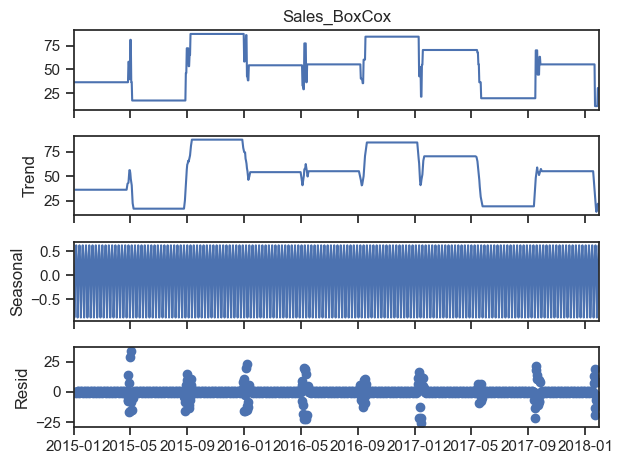

ADF Statistic: -2.3169205084041575
p-value: 0.16656882814891083


In [133]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(df_timeseries_box_cox['Sales_BoxCox'], model='additive')
decomposition.plot()
plt.show()

from statsmodels.tsa.stattools import adfuller
test_result = adfuller(df_timeseries_box_cox['Sales_BoxCox'])
print('ADF Statistic:', test_result[0])
print('p-value:', test_result[1])

Interpretation:

Stability of Transformations: The Box-Cox transformation helped in stabilizing the variance, making the series more amenable for analysis and modeling.

Significance of Trend and Seasonal Components: Both components are significant, indicating that any forecasting model should account for them to predict future values accurately.

Quality of Model Fit: The randomness of the residuals suggests that the decomposition has effectively captured the underlying patterns in the data, which is crucial for accurate forecasting.

Non-stationarity: The test suggests that the data, even after the Box-Cox transformation, still exhibits non-stationary behavior. This could be due to trends, cyclic patterns not captured by the seasonal adjustment, or other structural changes in the data.

Further Actions:
Differencing: Applying differencing to the data may help in making the series stationary. First differencing often removes a linear trend, so you might start there.

In [134]:
# First differencing
df_timeseries_box_cox['Sales_BoxCox_diff'] = df_timeseries_box_cox['Sales_BoxCox'].diff().dropna()

# Check stationarity again
result_diff = adfuller(df_timeseries_box_cox['Sales_BoxCox_diff'].dropna())
print('ADF Statistic:', result_diff[0])
print('p-value:', result_diff[1])

ADF Statistic: -17.137764565096113
p-value: 7.078700122207868e-30


Interpretation:

Stationarity Achieved: With the first differencing, time series now appears to be stationary. This implies that any trend or seasonality that might have influenced the original series has been effectively removed through this transformation.

In [135]:
import pmdarima as pm

# Assuming the seasonal period is 12 (e.g., monthly data with yearly seasonality)
sarima_model_Sales_BoxCox = pm.auto_arima(df_timeseries_box_cox['Sales_BoxCox'], 
                             seasonal=True, m=12, 
                             d=1, D=1,   # non-seasonal and seasonal differencing
                             start_p=0, start_q=0, max_p=3, max_q=3,
                             start_P=0, start_Q=0, max_P=2, max_Q=2,
                             trace=True, error_action='ignore', 
                             suppress_warnings=True, stepwise=True)

print(sarima_model_Sales_BoxCox.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=7477.794, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=7180.504, Time=0.69 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.55 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=7479.794, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=7061.882, Time=2.07 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=91.26 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=3.33 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=7059.882, Time=3.36 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=7178.504, Time=0.62 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=54.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=1.84 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=7061.882, Time=2.21 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=7063.882, Time=20.11 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=7061.865, Time=287.75 sec

Best model:  ARIMA(0,1,0)(2,1,0)[12]  

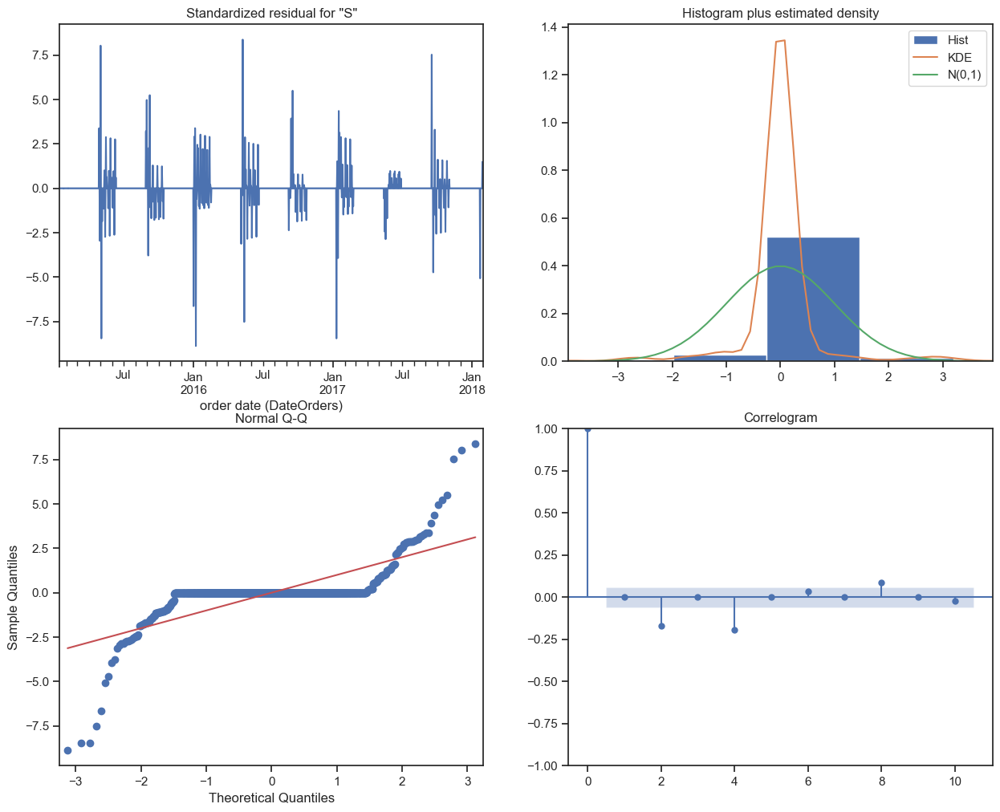

In [136]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Fit the best SARIMA model
model_Sales_BoxCox = sm.tsa.statespace.SARIMAX(df_timeseries_box_cox['Sales_BoxCox'], order=(0, 1, 0), seasonal_order=(2, 1, 0, 12))
results_Sales_BoxCox = model.fit()

# Plot the diagnostics
results_Sales_BoxCox.plot_diagnostics(figsize=(15, 12))
plt.show()



Now trying out Moving Average

In [137]:
# Sort the DataFrame by the date index to ensure monotonicity
df_timeseries_ma = df_timeseries_ma.sort_values('order date (DateOrders)')

# Set the date column as the index for time series analysis
df_timeseries_ma = df_timeseries_ma.set_index('order date (DateOrders)')

# Ensure the index is a DatetimeIndex and set a frequency

df_timeseries_ma = df_timeseries_ma.asfreq('d')
df_timeseries_ma = df_timeseries_ma.fillna(method='ffill')
df_timeseries_ma = df_timeseries_ma.fillna(method='bfill')


# Optionally check if any NaN remains
print(df_timeseries_ma.isna().sum())


Sales              0
Sales_MovingAvg    0
dtype: int64


C:\Users\CZ0068\AppData\Local\Temp\ipykernel_16468\2604202847.py:10: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_timeseries_ma = df_timeseries_ma.fillna(method='ffill')
C:\Users\CZ0068\AppData\Local\Temp\ipykernel_16468\2604202847.py:11: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_timeseries_ma = df_timeseries_ma.fillna(method='bfill')


In [138]:
df_timeseries_ma.shape

(1127, 2)

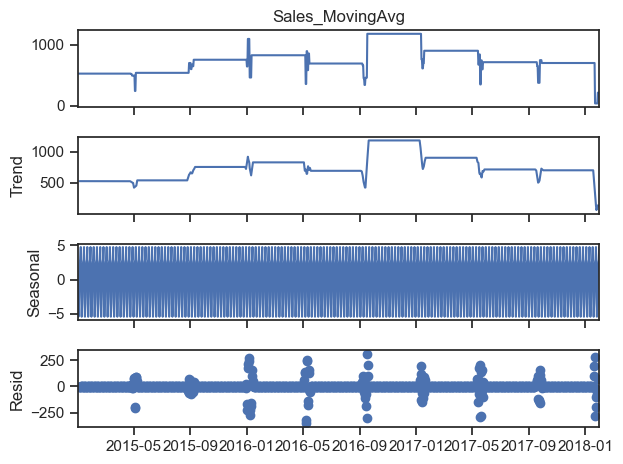

In [139]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(df_timeseries_ma['Sales_MovingAvg'], model='additive')
decomposition.plot()
plt.show()


In [140]:
from statsmodels.tsa.stattools import adfuller
test_result_ma = adfuller(df_timeseries_ma['Sales_MovingAvg'])
print('ADF Statistic:', test_result_ma[0])
print('p-value:', test_result_ma[1])

ADF Statistic: -2.0139826297054344
p-value: 0.2804760562808922


In [141]:
# First differencing
df_timeseries_ma['Sales_MovingAvg_diff'] = df_timeseries_ma['Sales_MovingAvg'].diff().dropna()

# Check stationarity again
result_diff_ma = adfuller(df_timeseries_ma['Sales_MovingAvg_diff'].dropna())
print('ADF Statistic:', result_diff_ma[0])
print('p-value:', result_diff_ma[1])

ADF Statistic: -15.800837872743266
p-value: 1.0745409334050848e-28


In [142]:
import pmdarima as pm

# Assuming the seasonal period is 12 (e.g., monthly data with yearly seasonality)
sarima_model_Sales_ma = pm.auto_arima(df_timeseries_ma['Sales_MovingAvg'], 
                             seasonal=True, m=12, 
                             d=1, D=1,   # non-seasonal and seasonal differencing
                             start_p=0, start_q=0, max_p=3, max_q=3,
                             start_P=0, start_Q=0, max_P=2, max_Q=2,
                             trace=True, error_action='ignore', 
                             suppress_warnings=True, stepwise=True)

print(sarima_model_Sales_ma.summary())



Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=12887.136, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=12598.955, Time=0.88 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=12889.136, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=12484.766, Time=3.85 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=86.15 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=12482.766, Time=2.26 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=12596.955, Time=0.81 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=49.48 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=2.50 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=12484.766, Time=3.86 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=inf, Time=63.49 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=12484.716, Time=47.52 sec

Best model:  ARIMA(0,1,0)(2,1,0)[12]

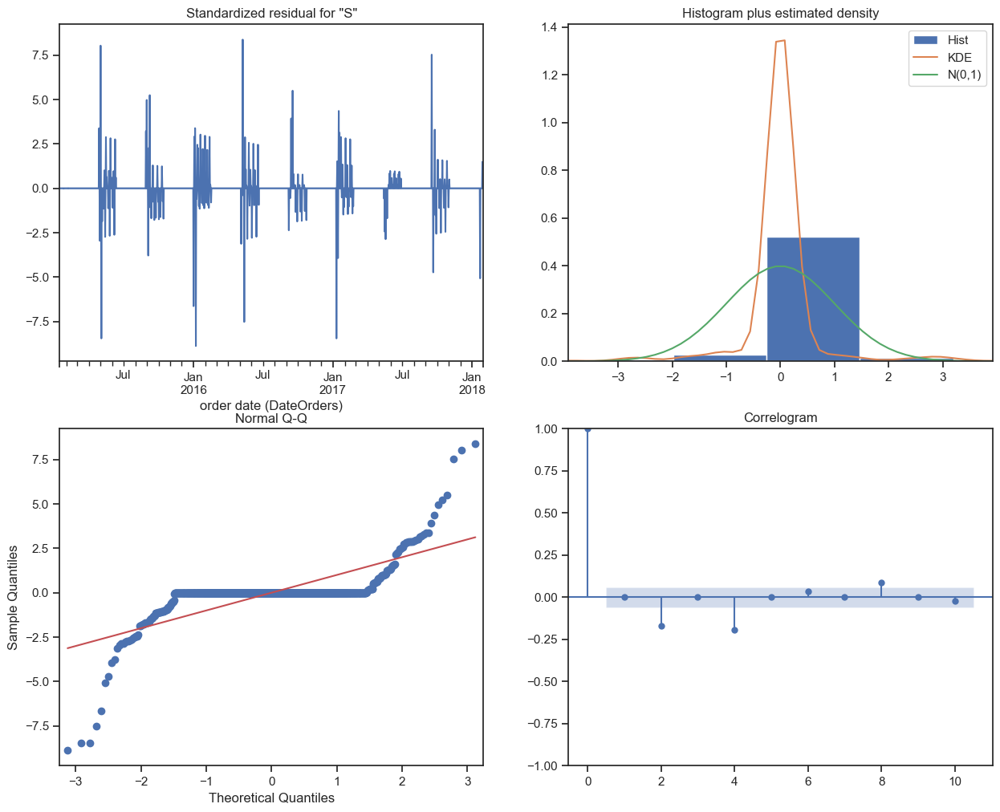

In [143]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Fit the best SARIMA model
model_Sales_ma = sm.tsa.statespace.SARIMAX(df_timeseries_ma['Sales_MovingAvg'], order=(0, 1, 0), seasonal_order=(2, 1, 0, 12))
results_ma = model.fit()

# Plot the diagnostics
results_ma.plot_diagnostics(figsize=(15, 12))
plt.show()

Given the strong performance in ADF statistics post-differencing and also other observations, trying SARIMA with  Log Sales and Box-Cox
 


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Box-Cox Transformation Errors:
MAE: 614.9607431162607, MSE: 378432.3930637376, RMSE: 615.1685891393819, MAPE: 3623.5769112629546%

Log Transformation Errors:
MAE: 634.2303354509268, MSE: 402249.30455238704, RMSE: 634.231270557032, MAPE: 14186.027374914753%


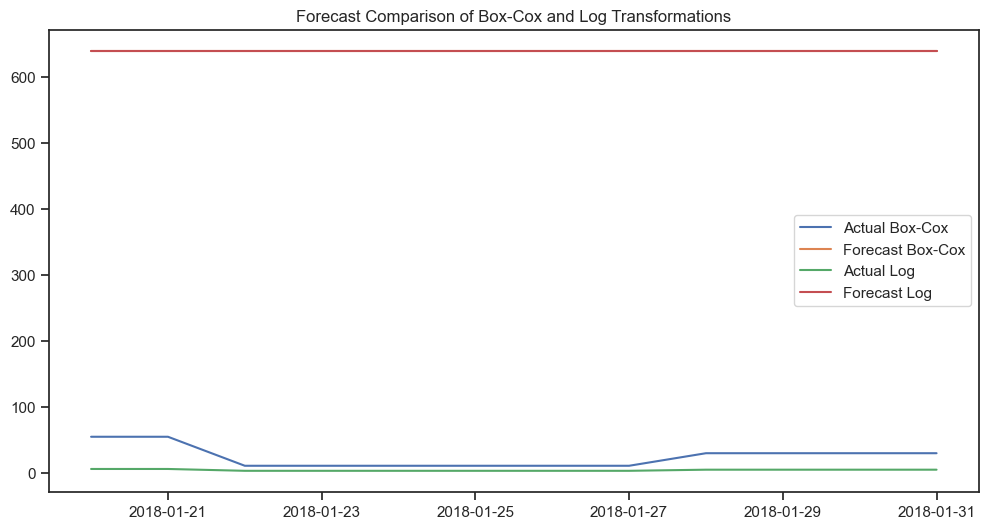

In [147]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error


# Split data into train and test for both transformations
train_data_boxcox = df_timeseries_box_cox['Sales_BoxCox'][:-12]  # Holding out the last 12 months for testing
test_data_boxcox = df_timeseries_box_cox['Sales_BoxCox'][-12:]

train_data_log = aggregated_sales['Log_Sales'][:-12]
test_data_log = aggregated_sales['Log_Sales'][-12:]


# Fit SARIMA function defined as before
def fit_sarima(data, seasonal_order=(2, 1, 0, 12)):
    model = SARIMAX(data, order=(0, 1, 0), seasonal_order=seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    return results

# Fit models
results_boxcox = fit_sarima(train_data_boxcox)
results_log = fit_sarima(train_data_log)

# Forecasting
forecast_boxcox = results_boxcox.get_forecast(steps=12)
forecast_log = results_log.get_forecast(steps=12)

# Actual test data for error calculation
actual_boxcox = test_data_boxcox
actual_log = test_data_log

# Inverse transformation to original scale
# Lambda for Box-Cox and adding 1 for the log transformation might need to be adjusted
lambda_boxcox= 0.5270136564457502
forecast_boxcox_values = np.exp(np.log(forecast_boxcox.predicted_mean * lambda_boxcox + 1) / lambda_boxcox)
forecast_log_values = np.exp(forecast_log.predicted_mean) - 1

# Calculate errors
def calculate_errors(actual, forecast):
    mae = mean_absolute_error(actual, forecast)
    mse = mean_squared_error(actual, forecast)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((actual - forecast) / actual)) * 100
    return mae, mse, rmse, mape

mae_boxcox, mse_boxcox, rmse_boxcox, mape_boxcox = calculate_errors(actual_boxcox, forecast_boxcox_values)
mae_log, mse_log, rmse_log, mape_log = calculate_errors(actual_log, forecast_log_values)

# Display the errors
print("Box-Cox Transformation Errors:")
print(f"MAE: {mae_boxcox}, MSE: {mse_boxcox}, RMSE: {rmse_boxcox}, MAPE: {mape_boxcox}%")

print("\nLog Transformation Errors:")
print(f"MAE: {mae_log}, MSE: {mse_log}, RMSE: {rmse_log}, MAPE: {mape_log}%")

# Optionally, display plots to compare visually
plt.figure(figsize=(12, 6))
plt.plot(actual_boxcox.index, actual_boxcox, label='Actual Box-Cox')
plt.plot(actual_boxcox.index, forecast_boxcox_values, label='Forecast Box-Cox')
plt.plot(actual_log.index, actual_log, label='Actual Log')
plt.plot(actual_log.index, forecast_log_values, label='Forecast Log')
plt.title('Forecast Comparison of Box-Cox and Log Transformations')
plt.legend()
plt.show()


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method nm is: xtol, ftol, maxfun. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method nm is: xtol, ftol, maxfun. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(


Box-Cox Transformation Errors:
MAE: 614.9607431162607, MSE: 378432.3930637376, RMSE: 615.1685891393819, MAPE: 3623.5769112629546%

Log Transformation Errors:
MAE: 634.2303354509268, MSE: 402249.30455238704, RMSE: 634.231270557032, MAPE: 14186.027374914753%


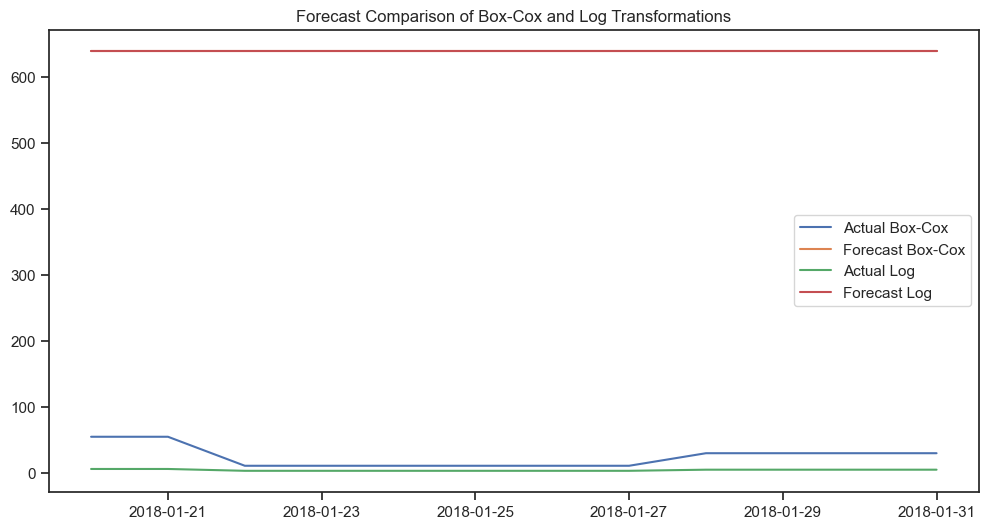

In [149]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the SARIMA fitting function with adjustments
def fit_sarima(data, seasonal_order=(2, 1, 0, 12), maxiter=500, method='nm', tol=1e-4):
    model = SARIMAX(data, order=(0, 1, 0), seasonal_order=seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    try:
        results = model.fit(disp=False, maxiter=maxiter, method=method, tol=tol)
    except ValueError as e:
        print(f"Model fitting failed: {e}")
        return None
    except np.linalg.LinAlgError:
        print("Model fitting encountered a linear algebra error.")
        return None
    return results

# Fit models with adjusted settings
results_boxcox = fit_sarima(train_data_boxcox)
results_log = fit_sarima(train_data_log)

if results_boxcox is None or results_log is None:
    print("Model fitting was unsuccessful.")
else:
    # Forecasting
    forecast_boxcox = results_boxcox.get_forecast(steps=12)
    forecast_log = results_log.get_forecast(steps=12)

    # Inverse transformation to original scale
    lambda_boxcox = 0.5270136564457502  # This should be the lambda used during the Box-Cox transformation
    forecast_boxcox_values = np.exp(np.log(forecast_boxcox.predicted_mean * lambda_boxcox + 1) / lambda_boxcox)
    forecast_log_values = np.exp(forecast_log.predicted_mean) - 1

    # Calculate errors
    def calculate_errors(actual, forecast):
        mae = mean_absolute_error(actual, forecast)
        mse = mean_squared_error(actual, forecast)
        rmse = np.sqrt(mse)
        mape = np.mean(np.abs((actual - forecast) / actual)) * 100
        return mae, mse, rmse, mape

    mae_boxcox, mse_boxcox, rmse_boxcox, mape_boxcox = calculate_errors(test_data_boxcox, forecast_boxcox_values)
    mae_log, mse_log, rmse_log, mape_log = calculate_errors(test_data_log, forecast_log_values)

    # Display the errors
    print("Box-Cox Transformation Errors:")
    print(f"MAE: {mae_boxcox}, MSE: {mse_boxcox}, RMSE: {rmse_boxcox}, MAPE: {mape_boxcox}%")

    print("\nLog Transformation Errors:")
    print(f"MAE: {mae_log}, MSE: {mse_log}, RMSE: {rmse_log}, MAPE: {mape_log}%")

    # Optionally, display plots to compare visually
    plt.figure(figsize=(12, 6))
    plt.plot(test_data_boxcox.index, test_data_boxcox, label='Actual Box-Cox')
    plt.plot(test_data_boxcox.index, forecast_boxcox_values, label='Forecast Box-Cox')
    plt.plot(test_data_log.index, test_data_log, label='Actual Log')
    plt.plot(test_data_log.index, forecast_log_values, label='Forecast Log')
    plt.title('Forecast Comparison of Box-Cox and Log Transformations')
    plt.legend()
    plt.show()


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method bfgs is: gtol, norm, epsilon. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method bfgs is: gtol, norm, epsilon. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(


Box-Cox Transformation Errors:
MAE: 614.9607431162607, MSE: 378432.3930637376, RMSE: 615.1685891393819, MAPE: 3623.5769112629546%

Log Transformation Errors:
MAE: 634.2303354509268, MSE: 402249.30455238704, RMSE: 634.231270557032, MAPE: 14186.027374914753%


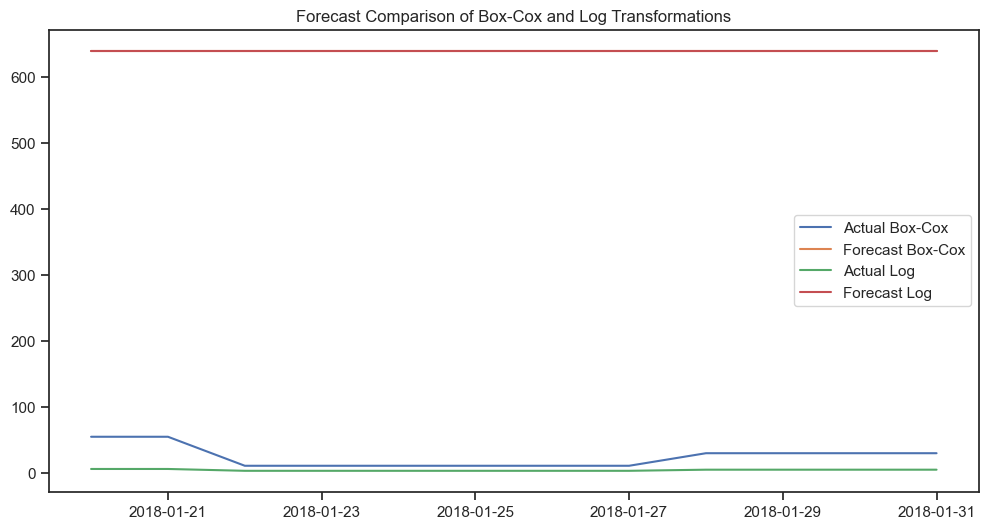

In [150]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the SARIMA fitting function with adjustments
def fit_sarima(data, seasonal_order=(2, 1, 0, 12), maxiter=500, method='bfgs', tol=1e-4):
    model = SARIMAX(data, order=(0, 1, 0), seasonal_order=seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    try:
        results = model.fit(disp=False, maxiter=maxiter, method=method, tol=tol)
    except ValueError as e:
        print(f"Model fitting failed: {e}")
        return None
    except np.linalg.LinAlgError:
        print("Model fitting encountered a linear algebra error.")
        return None
    return results

# Fit models with adjusted settings
results_boxcox = fit_sarima(train_data_boxcox)
results_log = fit_sarima(train_data_log)

if results_boxcox is None or results_log is None:
    print("Model fitting was unsuccessful.")
else:
    # Forecasting
    forecast_boxcox = results_boxcox.get_forecast(steps=12)
    forecast_log = results_log.get_forecast(steps=12)

    # Inverse transformation to original scale
    lambda_boxcox = 0.5270136564457502  # This should be the lambda used during the Box-Cox transformation
    forecast_boxcox_values = np.exp(np.log(forecast_boxcox.predicted_mean * lambda_boxcox + 1) / lambda_boxcox)
    forecast_log_values = np.exp(forecast_log.predicted_mean) - 1

    # Calculate errors
    def calculate_errors(actual, forecast):
        mae = mean_absolute_error(actual, forecast)
        mse = mean_squared_error(actual, forecast)
        rmse = np.sqrt(mse)
        mape = np.mean(np.abs((actual - forecast) / actual)) * 100
        return mae, mse, rmse, mape

    mae_boxcox, mse_boxcox, rmse_boxcox, mape_boxcox = calculate_errors(test_data_boxcox, forecast_boxcox_values)
    mae_log, mse_log, rmse_log, mape_log = calculate_errors(test_data_log, forecast_log_values)

    # Display the errors
    print("Box-Cox Transformation Errors:")
    print(f"MAE: {mae_boxcox}, MSE: {mse_boxcox}, RMSE: {rmse_boxcox}, MAPE: {mape_boxcox}%")

    print("\nLog Transformation Errors:")
    print(f"MAE: {mae_log}, MSE: {mse_log}, RMSE: {rmse_log}, MAPE: {mape_log}%")

    # Optionally, display plots to compare visually
    plt.figure(figsize=(12, 6))
    plt.plot(test_data_boxcox.index, test_data_boxcox, label='Actual Box-Cox')
    plt.plot(test_data_boxcox.index, forecast_boxcox_values, label='Forecast Box-Cox')
    plt.plot(test_data_log.index, test_data_log, label='Actual Log')
    plt.plot(test_data_log.index, forecast_log_values, label='Forecast Log')
    plt.title('Forecast Comparison of Box-Cox and Log Transformations')
    plt.legend()
    plt.show()


In [151]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error


# Split data into train and test sets for both transformations
train_data_boxcox = df_timeseries_box_cox['Sales_BoxCox'][:-12]  # Last 12 data points for testing
test_data_boxcox = df_timeseries_box_cox['Sales_BoxCox'][-12:]

train_data_log = aggregated_sales['Log_Sales'][:-12]
test_data_log = aggregated_sales['Log_Sales'][-12:]

# Define the available optimization methods
optimizers = ['lbfgs', 'bfgs', 'powell', 'cg', 'ncg', 'basinhopping']

# Results storage
results_storage = {}

# Loop over each optimizer
for optimizer in optimizers:
    print(f"\nFitting SARIMA models using optimizer: {optimizer}")
    try:
        # Define SARIMA fitting function
        def fit_sarima(data, seasonal_order=(2, 1, 0, 12), maxiter=500, method=optimizer, tol=1e-4):
            model = SARIMAX(data, order=(0, 1, 0), seasonal_order=seasonal_order,
                            enforce_stationarity=False, enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=maxiter, method=method, tol=tol)
            return results

        # Fit models
        results_boxcox = fit_sarima(train_data_boxcox)
        results_log = fit_sarima(train_data_log)

        # Forecasting
        forecast_boxcox = results_boxcox.get_forecast(steps=12)
        forecast_log = results_log.get_forecast(steps=12)

        # Inverse transformation to original scale
        lambda_boxcox = 0.5270136564457502  # This is the lambda used during the Box-Cox transformation
        forecast_boxcox_values = np.exp(np.log(forecast_boxcox.predicted_mean * lambda_boxcox + 1) / lambda_boxcox)
        forecast_log_values = np.exp(forecast_log.predicted_mean) - 1

        # Calculate errors
        def calculate_errors(actual, forecast):
            mae = mean_absolute_error(actual, forecast)
            mse = mean_squared_error(actual, forecast)
            rmse = np.sqrt(mse)
            mape = np.mean(np.abs((actual - forecast) / actual)) * 100
            return mae, mse, rmse, mape

        mae_boxcox, mse_boxcox, rmse_boxcox, mape_boxcox = calculate_errors(test_data_boxcox, forecast_boxcox_values)
        mae_log, mse_log, rmse_log, mape_log = calculate_errors(test_data_log, forecast_log_values)

        # Store results
        results_storage[optimizer] = {
            'boxcox': (mae_boxcox, mse_boxcox, rmse_boxcox, mape_boxcox),
            'log': (mae_log, mse_log, rmse_log, mape_log)
        }

        # Display the errors
        print(f"Optimizer: {optimizer} - Box-Cox Transformation Errors:")
        print(f"MAE: {mae_boxcox}, MSE: {mse_boxcox}, RMSE: {rmse_boxcox}, MAPE: {mape_boxcox}%")

        print(f"\nOptimizer: {optimizer} - Log Transformation Errors:")
        print(f"MAE: {mae_log}, MSE: {mse_log}, RMSE: {rmse_log}, MAPE: {mape_log}%")

    except Exception as e:
        print(f"Model fitting failed with optimizer {optimizer}: {e}")

# Plotting comparison for the best optimizer based on one of the metrics (e.g., RMSE)
best_optimizer_boxcox = min(results_storage, key=lambda k: results_storage[k]['boxcox'][2])
best_optimizer_log = min(results_storage, key=lambda k: results_storage[k]['log'][2])

print(f"\nBest optimizer for Box-Cox based on RMSE: {best_optimizer_boxcox}")
print(f"Best optimizer for Log based on RMSE: {best_optimizer_log}")

# Optionally plot results from the best optimizer
def plot_forecast(actual, forecast, title):
    plt.figure(figsize=(12, 6))
    plt.plot(actual.index, actual, label='Actual')
    plt.plot(actual.index, forecast, label='Forecast')
    plt.title(title)
    plt.legend()
    plt.show()

# Plot for best optimizer for Box-Cox
forecast_boxcox_best = fit_sarima(train_data_boxcox, method=best_optimizer_boxcox).get_forecast(steps=12)
forecast_boxcox_best_values = np.exp(np.log(forecast_boxcox_best.predicted_mean * lambda_boxcox + 1) / lambda_boxcox)
plot_forecast(test_data_boxcox, forecast_boxcox_best_values, f'Box-Cox Forecast with {best_optimizer_boxcox}')

# Plot for best optimizer for Log
forecast_log_best = fit_sarima(train_data_log, method=best_optimizer_log).get_forecast(steps=12)
forecast_log_best_values = np.exp(forecast_log_best.predicted_mean) - 1
plot_forecast(test_data_log, forecast_log_best_values, f'Log Forecast with {best_optimizer_log}')



Fitting SARIMA models using optimizer: lbfgs


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score, iprint. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score, iprint. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\m

Optimizer: lbfgs - Box-Cox Transformation Errors:
MAE: 614.9607431162607, MSE: 378432.3930637376, RMSE: 615.1685891393819, MAPE: 3623.5769112629546%

Optimizer: lbfgs - Log Transformation Errors:
MAE: 634.2303354509268, MSE: 402249.30455238704, RMSE: 634.231270557032, MAPE: 14186.027374914753%

Fitting SARIMA models using optimizer: bfgs


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method bfgs is: gtol, norm, epsilon. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method bfgs is: gtol, norm, epsilon. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(


Optimizer: bfgs - Box-Cox Transformation Errors:
MAE: 614.9607431162607, MSE: 378432.3930637376, RMSE: 615.1685891393819, MAPE: 3623.5769112629546%

Optimizer: bfgs - Log Transformation Errors:
MAE: 634.2303354509268, MSE: 402249.30455238704, RMSE: 634.231270557032, MAPE: 14186.027374914753%

Fitting SARIMA models using optimizer: powell


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method powell is: xtol, ftol, maxfun, start_direc. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method powell is: xtol, ftol, maxfun, start_direc. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(


Optimizer: powell - Box-Cox Transformation Errors:
MAE: 614.9607431162607, MSE: 378432.3930637376, RMSE: 615.1685891393819, MAPE: 3623.5769112629546%

Optimizer: powell - Log Transformation Errors:
MAE: 634.2303354509268, MSE: 402249.30455238704, RMSE: 634.231270557032, MAPE: 14186.027374914753%

Fitting SARIMA models using optimizer: cg


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method cg is: gtol, norm, epsilon. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method cg is: gtol, norm, epsilon. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(


Optimizer: cg - Box-Cox Transformation Errors:
MAE: 614.9607431162607, MSE: 378432.3930637376, RMSE: 615.1685891393819, MAPE: 3623.5769112629546%

Optimizer: cg - Log Transformation Errors:
MAE: 634.2303354509268, MSE: 402249.30455238704, RMSE: 634.231270557032, MAPE: 14186.027374914753%

Fitting SARIMA models using optimizer: ncg


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method ncg is: fhess_p, avextol, epsilon. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(


Model fitting failed with optimizer ncg: Cannot use complex-step approximations to calculate the hessian with untransformed parameters.

Fitting SARIMA models using optimizer: basinhopping


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method basinhopping is: niter, niter_success, T, stepsize, interval, minimizer, seed. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\base\optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method basinhopping is: niter, niter_success, T, stepsize, interval, minimizer, seed. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(


Have tried different options with different settings. SARIMA is not able to do the correct forecasting for both cases. Hence dropping it. We already have very good results with Linear Models and Tree based models.

### Prophet  

In [231]:
# Merge the Sales column back into the time series features DataFrame
df_timeseries_models_features = df_timeseries_models_features.join(df['Sales'])

# Verify that the Sales column is added
print(df_timeseries_models_features.head())


       Type  Benefit per order  Sales per customer   Delivery Status  Late_delivery_risk   Category Name Customer City Customer Country Customer Segment Customer State Department Name        Market  Order City Order Country order date (DateOrders)  Order Item Discount  Order Item Discount Rate  \
0     DEBIT          91.250000          314.640015  Advance shipping                   0  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia      Bekasi     Indonesia         1/31/2018 22:56            13.110000                      0.04   
1  TRANSFER        -249.089996          311.359985     Late delivery                   1  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia     Bikaner         India         1/13/2018 12:27            16.389999                      0.05   
2      CASH        -247.779999          309.720001  Shipping on time                   0  Sporting Goods  

In [232]:
# Prepare data for Prophet
df_prophet = df_timeseries_models_features.rename(columns={'order date (DateOrders)': 'ds', 'Sales': 'y'})

# Ensure the date column is of datetime type
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Display the first few rows to verify
print(df_prophet.head())


       Type  Benefit per order  Sales per customer   Delivery Status  Late_delivery_risk   Category Name Customer City Customer Country Customer Segment Customer State Department Name        Market  Order City Order Country                  ds  Order Item Discount  Order Item Discount Rate  \
0     DEBIT          91.250000          314.640015  Advance shipping                   0  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia      Bekasi     Indonesia 2018-01-31 22:56:00            13.110000                      0.04   
1  TRANSFER        -249.089996          311.359985     Late delivery                   1  Sporting Goods        Caguas      Puerto Rico         Consumer             PR         Fitness  Pacific Asia     Bikaner         India 2018-01-13 12:27:00            16.389999                      0.05   
2      CASH        -247.779999          309.720001  Shipping on time                   0  Sporting Goods      San Jose

Step 1: Encode and Prepare Data

In [233]:
from sklearn.preprocessing import LabelEncoder

# Create a copy to avoid changing the original DataFrame
df_encoded = df_timeseries_models_features.copy()

# Verify data types and encode if necessary
df_encoded['order date (DateOrders)'] = pd.to_datetime(df_encoded['order date (DateOrders)'])

# Select features to use as regressors
key_regressors = ['Product Price', 'Sales per customer', 'Order Item Discount']

# Prepare data for Prophet, including selected regressors
df_prophet = df_encoded.rename(columns={'order date (DateOrders)': 'ds', 'Sales': 'y'})

# Ensure the date column is of datetime type
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Sample data if needed to manage memory usage
df_prophet_sample = df_prophet.sample(frac=0.1, random_state=42)  # Adjust fraction as needed


Step 2: Fit the Prophet Model with Regressors (high corelation with Sales features )


In [234]:
from prophet import Prophet

# Initialize the Prophet model
model = Prophet()

# Add regressors to the model
for regressor in key_regressors:
    model.add_regressor(regressor)

# Fit the model to the sampled data
model.fit(df_prophet_sample)


18:04:37 - cmdstanpy - INFO - Chain [1] start processing
18:05:36 - cmdstanpy - INFO - Chain [1] done processing


Step-3: Make predictions

Step 4: Visualize the Forecast

c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


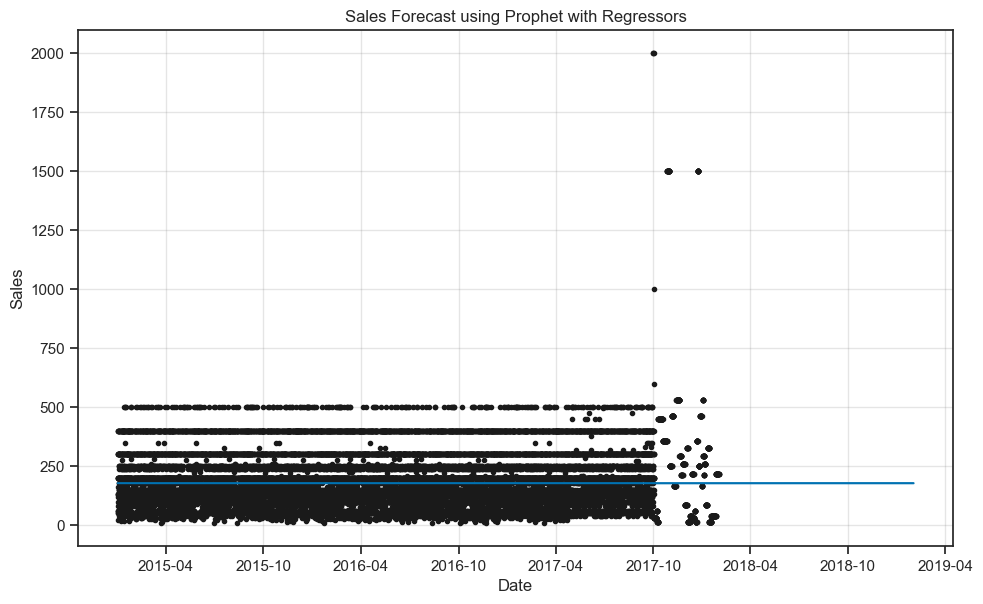

c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:397: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  artists += ax.plot(df_y['ds'].dt.to_pydatetime(), seas[name], ls='-',
c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:401: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Se

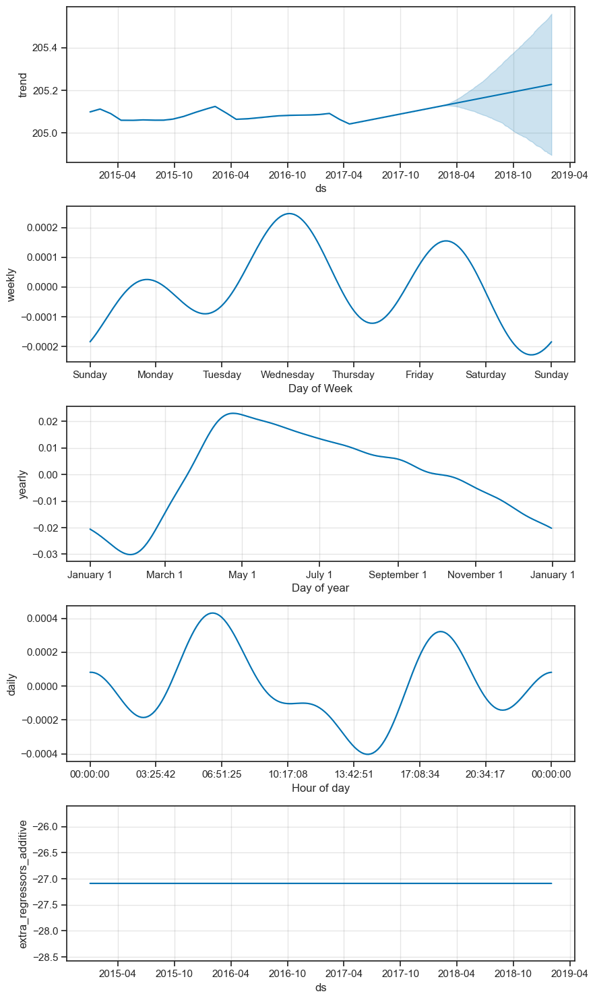

In [236]:
# Plot the forecast
fig = model.plot(forecast)
plt.title('Sales Forecast using Prophet with Regressors')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()

# Plot forecast components
fig2 = model.plot_components(forecast)
plt.show()


### Testing the model

Step 1: Split the Data

In [237]:
# Specify the date to split the data
split_date = '2018-12-31'  # Example split date, adjust based on  data

# Split the data into training and testing sets
train = df_prophet[df_prophet['ds'] <= split_date]
test = df_prophet[df_prophet['ds'] > split_date]

# Verify the split
print("Training set:", train.shape)
print("Testing set:", test.shape)


Training set: (180519, 28)
Testing set: (0, 28)


In [238]:
# Check the date range in  dataset
print("Earliest date:", df_prophet['ds'].min())
print("Latest date:", df_prophet['ds'].max())


Earliest date: 2015-01-01 00:00:00
Latest date: 2018-01-31 23:38:00


Taking a different date range

In [278]:
# Set an appropriate split date
split_date = '2017-08-30'

# Split the data into training and testing sets
train = df_prophet[df_prophet['ds'] <= split_date]
test = df_prophet[df_prophet['ds'] > split_date]

# Verify the split
print("Training set:", train.shape)
print("Testing set:", test.shape)


Training set: (166431, 28)
Testing set: (14088, 28)


1. Model Fitting

In [279]:
from prophet import Prophet

# Initialize the Prophet model
model = Prophet()

# Add regressors if any (if identified, key regressors from earlier analysis)
# This is an optional step, only include it if we have additional regressors
# for regressor in ['regressor1', 'regressor2']:
#     model.add_regressor(regressor)

# Fit the model to the training data
model.fit(train)


19:10:53 - cmdstanpy - INFO - Chain [1] start processing
19:11:17 - cmdstanpy - INFO - Chain [1] done processing


2. Cross-Validation Setup


In [283]:
from prophet.diagnostics import cross_validation, performance_metrics


# Try reducing the horizon and initial if  dataset is small
initial_size = '730 days'  # Start with 1 year of data, adjust based on  dataset size
horizon_size = '180 days'   # Forecast 3 months ahead
period_size = '180 days'   # Move every 6 months

try:
    df_cv = cross_validation(model, initial=initial_size, period=period_size, horizon=horizon_size)
    df_p = performance_metrics(df_cv)
    print(df_p.head())
except Exception as e:
    print("Error during cross-validation:", e)


  0%|          | 0/1 [00:00<?, ?it/s]

19:22:18 - cmdstanpy - INFO - Chain [1] start processing
19:22:27 - cmdstanpy - INFO - Chain [1] done processing


           horizon           mse        rmse        mae      mape     mdape     smape  coverage
0 17 days 16:10:00  12098.348834  109.992494  88.176648  0.782261  0.500298  0.474787  0.784205
1 17 days 16:31:00  12094.526895  109.975119  88.156738  0.781299  0.500298  0.474519  0.784465
2 17 days 16:52:00  12098.365816  109.992572  88.187698  0.781580  0.500298  0.474731  0.784530
3 17 days 17:13:00  12099.992892  109.999968  88.197514  0.781517  0.500286  0.474723  0.784530
4 17 days 17:34:00  12105.305381  110.024113  88.222898  0.781468  0.500286  0.474807  0.784465


3. Hyperparameter Tuning

In [285]:
from prophet.diagnostics import performance_metrics
import itertools

# Define parameter grid
param_grid = { 
    'changepoint_prior_scale': [0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross-validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(train)  # Fit model with given params
    df_cv = cross_validation(m, initial='730 days', period='180 days', horizon='180 days')
    df_p = performance_metrics(df_cv)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
best_params = all_params[np.argmin(rmses)]
print(best_params)


19:30:17 - cmdstanpy - INFO - Chain [1] start processing
19:30:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:30:42 - cmdstanpy - INFO - Chain [1] start processing
19:30:56 - cmdstanpy - INFO - Chain [1] done processing
19:32:22 - cmdstanpy - INFO - Chain [1] start processing
19:32:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:33:29 - cmdstanpy - INFO - Chain [1] start processing
19:33:37 - cmdstanpy - INFO - Chain [1] done processing
19:35:48 - cmdstanpy - INFO - Chain [1] start processing
19:36:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:37:29 - cmdstanpy - INFO - Chain [1] start processing
19:37:42 - cmdstanpy - INFO - Chain [1] done processing
19:38:31 - cmdstanpy - INFO - Chain [1] start processing
19:39:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:40:11 - cmdstanpy - INFO - Chain [1] start processing
19:40:28 - cmdstanpy - INFO - Chain [1] done processing
19:42:02 - cmdstanpy - INFO - Chain [1] start processing
19:43:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:43:32 - cmdstanpy - INFO - Chain [1] start processing
19:43:47 - cmdstanpy - INFO - Chain [1] done processing
19:45:16 - cmdstanpy - INFO - Chain [1] start processing
19:45:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:45:54 - cmdstanpy - INFO - Chain [1] start processing
19:46:09 - cmdstanpy - INFO - Chain [1] done processing
19:47:28 - cmdstanpy - INFO - Chain [1] start processing
19:47:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:48:12 - cmdstanpy - INFO - Chain [1] start processing
19:48:18 - cmdstanpy - INFO - Chain [1] done processing
19:49:59 - cmdstanpy - INFO - Chain [1] start processing
19:50:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:51:59 - cmdstanpy - INFO - Chain [1] start processing
19:52:04 - cmdstanpy - INFO - Chain [1] done processing
19:52:59 - cmdstanpy - INFO - Chain [1] start processing
19:53:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:53:20 - cmdstanpy - INFO - Chain [1] start processing
19:53:27 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10.0}


4. Fit Model with Best Parameters

In [286]:
model = Prophet(**best_params)
model.fit(train)

19:55:35 - cmdstanpy - INFO - Chain [1] start processing
19:56:07 - cmdstanpy - INFO - Chain [1] done processing


5. Make Predictions and Test

In [287]:
future = model.make_future_dataframe(periods=len(test), freq='D', include_history=True)
forecast = model.predict(future)
forecast_filtered = forecast[forecast['ds'].isin(test['ds'])]


6. Evaluate the Model

In [289]:
print("Length of test dataset:", len(test))
print("Length of filtered forecast:", len(forecast_filtered))


Length of test dataset: 14088
Length of filtered forecast: 8


In [290]:
print("Test date range:", test['ds'].min(), "to", test['ds'].max())
print("Forecast date range:", forecast['ds'].min(), "to", forecast['ds'].max())


Test date range: 2017-08-30 00:02:00 to 2018-01-31 23:38:00
Forecast date range: 2015-01-01 00:00:00 to 2056-03-25 23:41:00


In [291]:
# Generate a future DataFrame that covers only the test dates
future = model.make_future_dataframe(periods=len(test), freq='D', include_history=False)

# Ensure future only includes up to the end of the test set
future = future[future['ds'] <= test['ds'].max()]


In [292]:
# Predict using the future DataFrame
forecast = model.predict(future)


In [293]:
# Filter the forecast to include only test set dates
forecast_filtered = forecast[forecast['ds'].isin(test['ds'])]

# Recheck the alignment and lengths
print("Filtered forecast length:", len(forecast_filtered))
print("Unique dates in test set:", test['ds'].nunique())
print("Unique dates in filtered forecast:", forecast_filtered['ds'].nunique())


Filtered forecast length: 8
Unique dates in test set: 10241
Unique dates in filtered forecast: 8


In [294]:
# Make sure future DataFrame includes the entire range of test set dates
future_dates = pd.date_range(start=test['ds'].min(), end=test['ds'].max(), freq='D')

# Ensure future only includes test dates
future = pd.DataFrame({'ds': future_dates})


In [295]:
# Predict using the correctly limited future DataFrame
forecast = model.predict(future)


In [296]:
# The forecast should now align with the test set
forecast_filtered = forecast[forecast['ds'].isin(test['ds'])]

# Verify the alignment and lengths again
print("Filtered forecast length:", len(forecast_filtered))
print("Unique dates in test set:", test['ds'].nunique())
print("Unique dates in filtered forecast:", forecast_filtered['ds'].nunique())


Filtered forecast length: 10
Unique dates in test set: 10241
Unique dates in filtered forecast: 10


In [297]:
# Use the exact dates from the test set for forecasting
future = test[['ds']].copy()

# This will create a future DataFrame with the same dates as the test set


In [298]:
# Predict using the model
forecast = model.predict(future)

# Align forecast with the test dates explicitly
forecast_filtered = forecast[forecast['ds'].isin(test['ds'])]

# Confirm the alignment and lengths again
print("Filtered forecast length:", len(forecast_filtered))
print("Unique dates in test set:", test['ds'].nunique())
print("Unique dates in filtered forecast:", forecast_filtered['ds'].nunique())


Filtered forecast length: 14088
Unique dates in test set: 10241
Unique dates in filtered forecast: 10241


In [299]:
# Drop duplicates to ensure only one prediction per date
forecast_filtered = forecast_filtered.drop_duplicates(subset='ds')

# Verify the lengths again
print("Filtered forecast length after dropping duplicates:", len(forecast_filtered))
print("Unique dates in test set:", test['ds'].nunique())
print("Unique dates in filtered forecast:", forecast_filtered['ds'].nunique())


Filtered forecast length after dropping duplicates: 10241
Unique dates in test set: 10241
Unique dates in filtered forecast: 10241


In [303]:
# Sort both datasets to ensure they are aligned
test = test.sort_values('ds').reset_index(drop=True)
forecast_filtered = forecast_filtered.sort_values('ds').reset_index(drop=True)

# Check lengths again
print("Length of test dataset:", len(test))
print("Length of filtered forecast dataset:", len(forecast_filtered))


Length of test dataset: 14088
Length of filtered forecast dataset: 10241


In [304]:
# Check for any missing dates between test and forecast
missing_in_forecast = set(test['ds']) - set(forecast_filtered['ds'])
extra_in_forecast = set(forecast_filtered['ds']) - set(test['ds'])

print("Dates in test but missing in forecast:", missing_in_forecast)
print("Dates in forecast but not in test:", extra_in_forecast)


Dates in test but missing in forecast: set()
Dates in forecast but not in test: set()


In [305]:
# Check and remove duplicates
forecast_filtered = forecast_filtered.drop_duplicates(subset='ds')
test = test.drop_duplicates(subset='ds')

# Verify lengths again
print("Length of test dataset after dropping duplicates:", len(test))
print("Length of filtered forecast dataset after dropping duplicates:", len(forecast_filtered))


Length of test dataset after dropping duplicates: 10241
Length of filtered forecast dataset after dropping duplicates: 10241


In [306]:
# Verify unique dates count
unique_test_dates = test['ds'].nunique()
unique_forecast_dates = forecast_filtered['ds'].nunique()

print("Unique dates in test dataset:", unique_test_dates)
print("Unique dates in forecast dataset:", unique_forecast_dates)

# Check if any duplicates were affecting unique counts
assert unique_test_dates == unique_forecast_dates, "Mismatch in unique dates between test and forecast."


Unique dates in test dataset: 10241
Unique dates in forecast dataset: 10241


In [307]:
# Ensure full alignment
test = test[test['ds'].isin(forecast_filtered['ds'])]
forecast_filtered = forecast_filtered[forecast_filtered['ds'].isin(test['ds'])]

# Sort and reset index
test = test.sort_values('ds').reset_index(drop=True)
forecast_filtered = forecast_filtered.sort_values('ds').reset_index(drop=True)

# Final length check
print("Final length of test dataset:", len(test))
print("Final length of filtered forecast dataset:", len(forecast_filtered))

assert len(test) == len(forecast_filtered), "Test and forecast datasets do not align after deduplication."


Final length of test dataset: 10241
Final length of filtered forecast dataset: 10241


In [308]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate metrics
mae = mean_absolute_error(test['y'], forecast_filtered['yhat'])
rmse = mean_squared_error(test['y'], forecast_filtered['yhat'], squared=False)

print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)


Mean Absolute Error: 182.78446007011328
Root Mean Squared Error: 309.51363930896883


c:\Users\CZ0068\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


7. Visualization

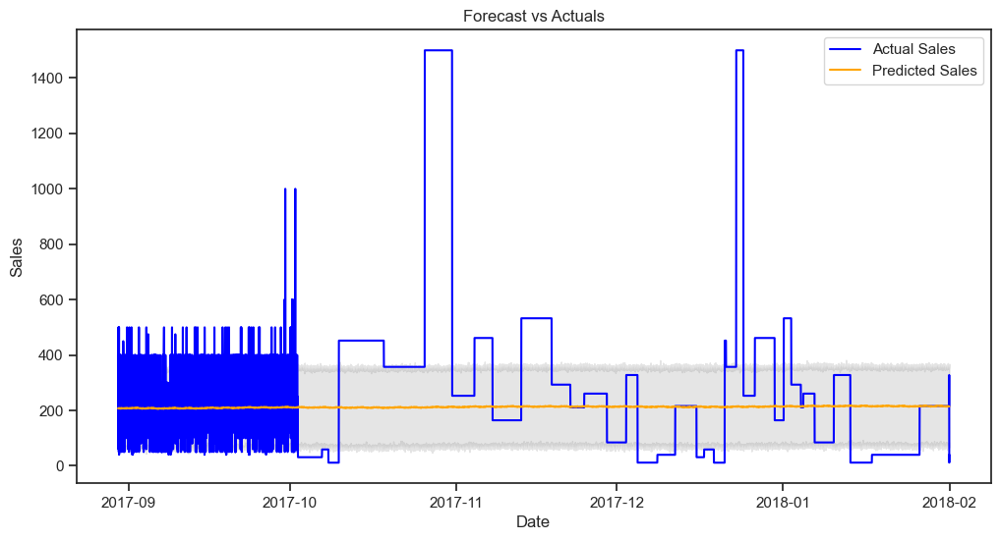

In [309]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(test['ds'], test['y'], label='Actual Sales', color='blue')
plt.plot(forecast_filtered['ds'], forecast_filtered['yhat'], label='Predicted Sales', color='orange')
plt.fill_between(forecast_filtered['ds'], forecast_filtered['yhat_lower'], forecast_filtered['yhat_upper'], color='gray', alpha=0.2)
plt.title('Forecast vs Actuals')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()



### Interpretation of Error Metrics

#### Mean Absolute Error (MAE)

- **MAE = 182.78**: This value represents the average absolute difference between the predicted sales and the actual sales. On average, the model's predictions are off by approximately 182.78 units of sales.
  
  - **Interpretation**: 
    - If the sales figures are typically in the range of thousands, this could be considered a significant error, suggesting that the model's predictions are not very accurate.
    - Conversely, if the sales figures are much larger (e.g., tens of thousands), an error of 182.78 might be acceptable.

#### Root Mean Squared Error (RMSE)

- **RMSE = 309.51**: This value indicates the standard deviation of the residuals (prediction errors). It provides a measure of how concentrated the data is around the line of best fit.
  
  - **Interpretation**:
    - RMSE is more sensitive to outliers than MAE because it squares the errors before averaging them. This means that large errors will have a disproportionately large impact on the RMSE.
    - An RMSE of 309.51 indicates that there are some substantial errors in the predictions, especially if compared to the average sales figures.

### Evaluating Model Performance

1. **Comparison with Baseline**: Compare these error metrics with a baseline model (such as predicting the mean of the training data) to evaluate if  model is performing better.

2. **Scale of Sales Data**: Understand the scale of  sales data. Are these errors reasonable given the typical range of sales values?

3. **Visual Inspection**: Besides numerical metrics, visualizing the predictions against actual values can offer insights into where the model might be struggling (e.g., seasonal trends, unexpected spikes).

4. **Feature Analysis**: Review which features are included in the model. Sometimes additional relevant features or external variables (like promotions or economic indicators) can improve model accuracy.

5. **Hyperparameter Tuning**: Experiment with different model settings or incorporate additional regressors that may better capture the trends and seasonality of the data.

### Recommendations for Improvement

- **Incorporate More Regressors**: If possible, add more features to capture various factors affecting sales (e.g., promotions, marketing spend, or external economic indicators).

- **Parameter Tuning**: Experiment with different hyperparameters in Prophet, such as adjusting seasonality components or changing the prior scales.

- **Data Pre-processing**: Ensure data is clean and any anomalies or outliers are addressed, as these can skew predictions significantly.

- **Model Comparison**: Try other forecasting methods such as ARIMA or machine learning models like Gradient Boosting or LSTM, which might capture patterns differently.

- **Cross-Validation**: Implement more robust cross-validation strategies to ensure the model's generalization ability over different periods.

By refining the model with these insights, we may achieve improved predictive performance. If you have any further questions or need more assistance, feel free to ask!